In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
train_df = pd.read_csv('clean_data/clean_data_train.csv')
test_df = pd.read_csv('clean_data/clean_data_test.csv')
target_var = 'temperature_2m'

1. THỐNG KÊ TỔNG QUAN TẬP HUẤN LUYỆN (TRAIN SET)
- Số mẫu (dòng): 42573
- Số đặc trưng (cột): 8

- Kiểu dữ liệu và Số mẫu trống (Null/NaN) của từng đặc trưng:
<class 'pandas.DataFrame'>
RangeIndex: 42573 entries, 0 to 42572
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   time                     42573 non-null  str    
 1   wind_speed_10m           42573 non-null  float64
 2   temperature_2m           42573 non-null  float64
 3   cloud_cover              42573 non-null  float64
 4   relative_humidity_2m     42573 non-null  float64
 5   surface_pressure         42573 non-null  float64
 6   precipitation            42573 non-null  float64
 7   vapour_pressure_deficit  42573 non-null  float64
dtypes: float64(7), str(1)
memory usage: 2.6 MB

- Thống kê mô tả (Mean, Min, Max, Quartiles):


,count,mean,std,min,25%,50%,75%,max
wind_speed_10m,42573.0,10.323033,6.517729,0.00000,5.342696,9.000000,13.979872,59.184700
temperature_2m,42573.0,26.325219,3.778644,15.10000,23.800000,26.200000,28.650000,40.150000
cloud_cover,42573.0,74.686515,34.041800,0.00000,49.000000,97.000000,100.000000,100.000000
relative_humidity_2m,42573.0,81.873648,11.702964,30.71473,75.946770,84.465515,90.589490,100.000000
surface_pressure,42573.0,1009.028093,5.382939,982.16864,1004.862200,1008.637760,1013.105700,1025.091800
precipitation,42573.0,0.275564,1.097433,0.00000,0.000000,0.000000,0.100000,41.900000
vapour_pressure_deficit,42573.0,0.703620,0.641714,0.00000,0.288026,0.498605,0.873996,5.146684



2. PHÂN TÍCH DISTRIBUTION SHIFT (TRAIN vs TEST)


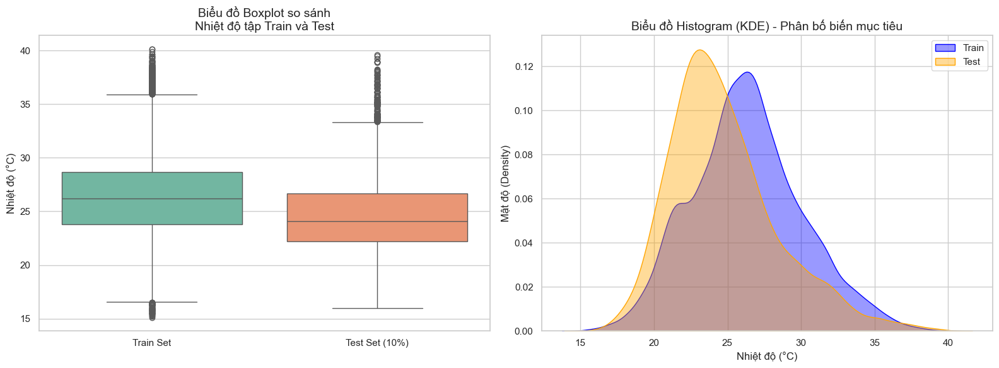

In [4]:
print("="*50)
print("1. THỐNG KÊ TỔNG QUAN TẬP HUẤN LUYỆN (TRAIN SET)")
print("="*50)
print(f"- Số mẫu (dòng): {len(train_df)}")
print(f"- Số đặc trưng (cột): {len(train_df.columns)}")
print("\n- Kiểu dữ liệu và Số mẫu trống (Null/NaN) của từng đặc trưng:")

train_df.info()

print("\n- Thống kê mô tả (Mean, Min, Max, Quartiles):")
display(train_df.describe().T)

print("\n" + "="*50)
print("2. PHÂN TÍCH DISTRIBUTION SHIFT (TRAIN vs TEST)")
print("="*50)

# Thiết lập phong cách biểu đồ
sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# ---- Biểu đồ 1: Boxplot so sánh phân bố ----
plot_data = pd.DataFrame({
    'Train Set': train_df[target_var],
    'Test Set (10%)': test_df[target_var]
})

sns.boxplot(data=plot_data, ax=axes[0], palette="Set2")
axes[0].set_title(f'Biểu đồ Boxplot so sánh\nNhiệt độ tập Train và Test', fontsize=14)
axes[0].set_ylabel('Nhiệt độ (°C)')

# ---- Biểu đồ 2: Histogram / KDE (Đường cong phân bố) ----
sns.kdeplot(data=train_df[target_var], ax=axes[1], fill=True, color="blue", label="Train", alpha=0.4)
sns.kdeplot(data=test_df[target_var], ax=axes[1], fill=True, color="orange", label="Test", alpha=0.4)
axes[1].set_title('Biểu đồ Histogram (KDE) - Phân bố biến mục tiêu', fontsize=14)
axes[1].set_xlabel('Nhiệt độ (°C)')
axes[1].set_ylabel('Mật độ (Density)')
axes[1].legend()

plt.tight_layout()
plt.show()

PHÂN TÍCH BIẾN NGOẠI SINH & KIỂM TRA DISTRIBUTION SHIFT


C:\Users\Danh\AppData\Local\Temp\ipykernel_15536\2559832932.py:52: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Dataset', y=col, data=box_data, ax=axes[i, 1], palette=["#3498db", "#e74c3c"])
C:\Users\Danh\AppData\Local\Temp\ipykernel_15536\2559832932.py:52: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Dataset', y=col, data=box_data, ax=axes[i, 1], palette=["#3498db", "#e74c3c"])
C:\Users\Danh\AppData\Local\Temp\ipykernel_15536\2559832932.py:52: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Dataset', y=col, data=box_data, ax=axes[i

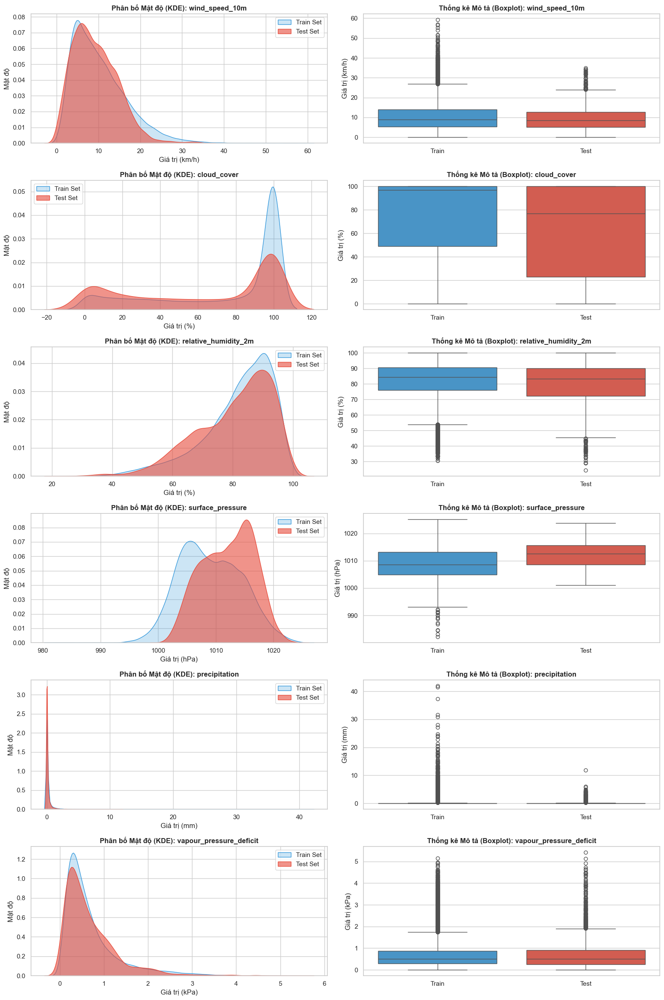

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

print("="*60)
print("PHÂN TÍCH BIẾN NGOẠI SINH & KIỂM TRA DISTRIBUTION SHIFT")
print("="*60)

# Danh sách các biến ngoại sinh cần phân tích
exogenous_vars = [
    'wind_speed_10m', 'cloud_cover', 'relative_humidity_2m', 
    'surface_pressure', 'precipitation', 'vapour_pressure_deficit'
]

# 1. BỔ SUNG DICTIONARY ĐƠN VỊ 
# (Bạn có thể điều chỉnh lại nếu dataset của bạn dùng đơn vị khác, ví dụ m/s thay vì km/h)
units = {
    'wind_speed_10m': 'km/h', 
    'cloud_cover': '%', 
    'relative_humidity_2m': '%', 
    'surface_pressure': 'hPa', 
    'precipitation': 'mm', 
    'vapour_pressure_deficit': 'kPa'
}

# Cài đặt giao diện
sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(len(exogenous_vars), 2, figsize=(16, 4 * len(exogenous_vars)))

for i, col in enumerate(exogenous_vars):
    # Lấy đơn vị tương ứng với biến hiện tại, nếu không có thì để trống
    unit = units.get(col, '')
    label_with_unit = f'Giá trị ({unit})' if unit else 'Giá trị'
    
    # 2. Vẽ KDE Plot (Kiểm tra Distribution Shift)
    sns.kdeplot(data=train_df[col], ax=axes[i, 0], fill=True, color="#3498db", label="Train Set")
    sns.kdeplot(data=test_df[col], ax=axes[i, 0], fill=True, color="#e74c3c", label="Test Set", alpha=0.6)
    axes[i, 0].set_title(f'Phân bố Mật độ (KDE): {col}', fontsize=12, fontweight='bold')
    
    # -> Cập nhật label trục X có chứa đơn vị
    axes[i, 0].set_xlabel(label_with_unit) 
    axes[i, 0].set_ylabel('Mật độ')
    axes[i, 0].legend()
    
    # 3. Vẽ Boxplot (Kiểm tra Outliers và Thống kê mô tả)
    temp_train = train_df[[col]].copy()
    temp_train['Dataset'] = 'Train'
    temp_test = test_df[[col]].copy()
    temp_test['Dataset'] = 'Test'
    box_data = pd.concat([temp_train, temp_test])
    
    sns.boxplot(x='Dataset', y=col, data=box_data, ax=axes[i, 1], palette=["#3498db", "#e74c3c"])
    axes[i, 1].set_title(f'Thống kê Mô tả (Boxplot): {col}', fontsize=12, fontweight='bold')
    axes[i, 1].set_xlabel('')
    
    # -> Cập nhật label trục Y có chứa đơn vị
    axes[i, 1].set_ylabel(label_with_unit)

plt.tight_layout()
plt.show()

PHÂN TÍCH TƯƠNG QUAN ĐA BIẾN (MULTIVARIATE CORRELATION)


C:\Users\Danh\AppData\Local\Temp\ipykernel_20892\1806439555.py:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=target_corr.values, y=target_corr.index, ax=axes[1], palette='coolwarm')


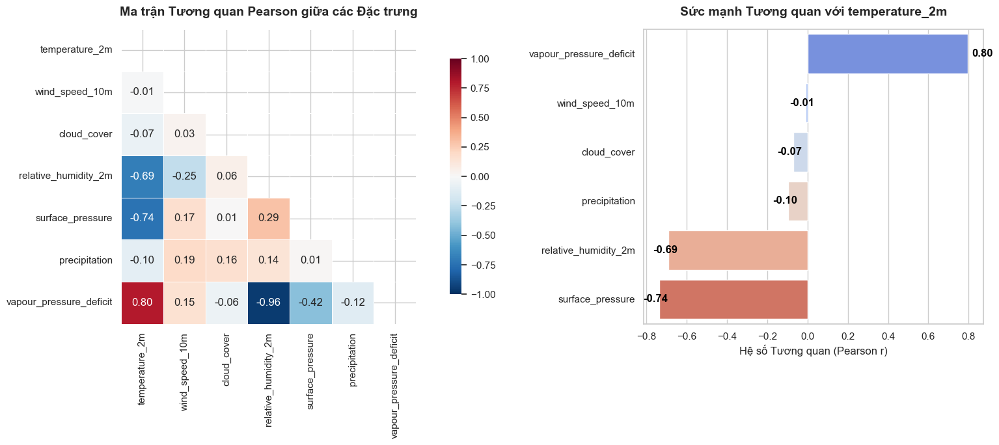

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

print("="*60)
print("PHÂN TÍCH TƯƠNG QUAN ĐA BIẾN (MULTIVARIATE CORRELATION)")
print("="*60)

# 1. Định nghĩa các biến cần phân tích
exogenous_vars = [
    'wind_speed_10m', 'cloud_cover', 'relative_humidity_2m', 
    'surface_pressure', 'precipitation', 'vapour_pressure_deficit'
]

# Gộp thành một danh sách (đưa target lên đầu hoặc cuối để dễ nhìn)
cols_to_corr = [target_var] + exogenous_vars
corr_data = train_df[cols_to_corr].dropna()

# 2. Tính toán Ma trận Tương quan Pearson
corr_matrix = corr_data.corr(method='pearson')

# 3. Khởi tạo không gian vẽ 1 hàng 2 cột
fig, axes = plt.subplots(1, 2, figsize=(18, 7), gridspec_kw={'width_ratios': [2, 1]})
sns.set_theme(style="whitegrid")

# --- BIỂU ĐỒ 1: MA TRẬN TƯƠNG QUAN (HEATMAP) ---
# Tạo mask để ẩn nửa trên của ma trận (vì nó đối xứng, ẩn đi cho gọn)
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Vẽ Heatmap
sns.heatmap(corr_matrix, mask=mask, annot=True, fmt=".2f", cmap='RdBu_r', 
            vmax=1, vmin=-1, center=0, square=True, linewidths=.5, 
            cbar_kws={"shrink": .8}, ax=axes[0])
axes[0].set_title('Ma trận Tương quan Pearson giữa các Đặc trưng', fontsize=14, fontweight='bold', pad=15)

# --- BIỂU ĐỒ 2: MỨC ĐỘ TƯƠNG QUAN VỚI BIẾN MỤC TIÊU ---
# Lấy cột tương quan của target, bỏ chính nó đi, và sắp xếp giảm dần
target_corr = corr_matrix[target_var].drop(target_var).sort_values(ascending=False)

# Vẽ Barplot
sns.barplot(x=target_corr.values, y=target_corr.index, ax=axes[1], palette='coolwarm')
axes[1].set_title(f'Sức mạnh Tương quan với {target_var}', fontsize=14, fontweight='bold', pad=15)
axes[1].set_xlabel('Hệ số Tương quan (Pearson r)')
axes[1].set_ylabel('')

# Thêm giá trị text lên từng cột bar
for i, v in enumerate(target_corr.values):
    axes[1].text(v + (0.02 if v > 0 else -0.08), i, f"{v:.2f}", color='black', va='center', fontweight='bold')

plt.tight_layout()
plt.show()

7. PHÂN TÍCH ĐỘ PHÂN TÁN VÀ XU HƯỚNG MÙA VỤ (BOXPLOT & SWARMPLOT)


C:\Users\Danh\AppData\Local\Temp\ipykernel_15536\2869989427.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=box_df, x='month', y=target_var, ax=axes[0], palette='coolwarm', boxprops=dict(alpha=.4))
C:\Users\Danh\AppData\Local\Temp\ipykernel_15536\2869989427.py:46: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=box_df, x='Season', y=target_var, ax=axes[1], palette='Set2', boxprops=dict(alpha=.4))
C:\Users\Danh\AppData\Local\Temp\ipykernel_15536\2869989427.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.swarmplot(data=sample_box_df,

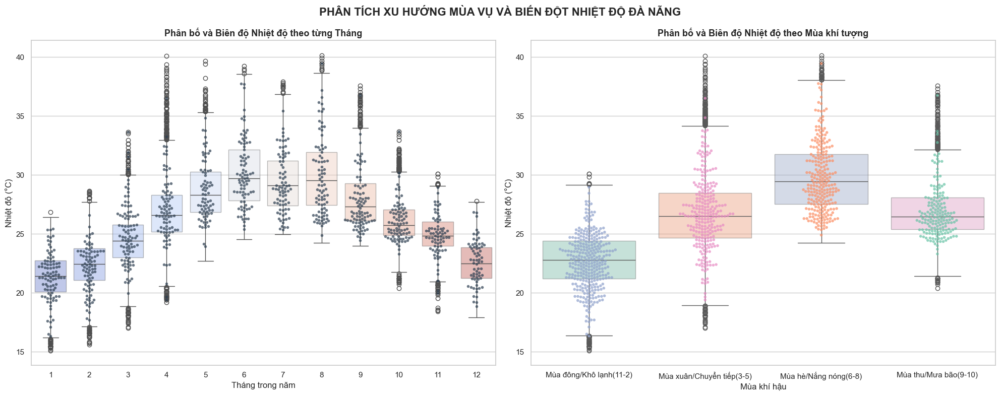


📊 THỐNG KÊ TỶ LỆ DỊCH CHUYỂN NỀN NHIỆT TRUNG BÌNH QUA CÁC THÁNG (%):
 - Tháng 01 -> Tháng 02: Tăng 4.88% (Nhiệt độ TB tháng 2: 22.4°C)
 - Tháng 02 -> Tháng 03: Tăng 9.02% (Nhiệt độ TB tháng 3: 24.4°C)
 - Tháng 03 -> Tháng 04: Tăng 10.12% (Nhiệt độ TB tháng 4: 26.9°C)
 - Tháng 04 -> Tháng 05: Tăng 6.42% (Nhiệt độ TB tháng 5: 28.6°C)
 - Tháng 05 -> Tháng 06: Tăng 5.31% (Nhiệt độ TB tháng 6: 30.1°C)
 - Tháng 06 -> Tháng 07: Giảm 2.13% (Nhiệt độ TB tháng 7: 29.5°C)
 - Tháng 07 -> Tháng 08: Tăng 1.57% (Nhiệt độ TB tháng 8: 30.0°C)
 - Tháng 08 -> Tháng 09: Giảm 7.12% (Nhiệt độ TB tháng 9: 27.8°C)
 - Tháng 09 -> Tháng 10: Giảm 6.43% (Nhiệt độ TB tháng 10: 26.0°C)
 - Tháng 10 -> Tháng 11: Giảm 4.02% (Nhiệt độ TB tháng 11: 25.0°C)
 - Tháng 11 -> Tháng 12: Giảm 9.66% (Nhiệt độ TB tháng 12: 22.6°C)


In [6]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

print("="*50)
print("7. PHÂN TÍCH ĐỘ PHÂN TÁN VÀ XU HƯỚNG MÙA VỤ (BOXPLOT & SWARMPLOT)")
print("="*50)

# 1. Chuẩn bị dữ liệu sao lưu
box_df = train_df.copy()

# Đảm bảo có cột 'month' và 'temperature' chuẩn
if 'time' in box_df.columns:
    box_df['time'] = pd.to_datetime(box_df['time'])
    box_df['month'] = box_df['time'].dt.month
else:
    box_df.index = pd.to_datetime(box_df.index)
    box_df['month'] = box_df.index.month

target_var = target_var if 'target_col' in locals() else 'temperature_2m'

# Định nghĩa hàm ánh xạ Tháng sang Mùa đặc trưng khí tượng Đà Nẵng
def get_season(month):
    if month in [11, 12, 1, 2]: return 'Mùa đông/Khô lạnh(11-2)'
    elif month in [3, 4, 5]: return 'Mùa xuân/Chuyển tiếp(3-5)'
    elif month in [6, 7, 8]: return 'Mùa hè/Nắng nóng(6-8)'
    else: return 'Mùa thu/Mưa bão(9-10)'

box_df['Season'] = box_df['month'].apply(get_season)

# 2. Tạo khung vẽ subplots (1 hàng 2 cột) để so sánh song song Tháng và Mùa
fig, axes = plt.subplots(1, 2, figsize=(20, 8))
sns.set_theme(style="whitegrid")

# --- ĐỒ THỊ 1: PHÂN BỐ NHIỆT ĐỘ THEO TỪNG THÁNG ---
# Vì dữ liệu hàng giờ rất lớn (>40k dòng), ta lấy mẫu (sample) khoảng 1000 dòng để vẽ Swarmplot không bị đè đặc
sample_box_df = box_df.sample(n=1000, random_state=42) if len(box_df) > 1000 else box_df

sns.boxplot(data=box_df, x='month', y=target_var, ax=axes[0], palette='coolwarm', boxprops=dict(alpha=.4))
sns.swarmplot(data=sample_box_df, x='month', y=target_var, ax=axes[0], color='#2c3e50', size=4, alpha=0.7)
axes[0].set_title('Phân bố và Biên độ Nhiệt độ theo từng Tháng', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Tháng trong năm')
axes[0].set_ylabel('Nhiệt độ (°C)')

# --- ĐỒ THỊ 2: PHÂN BỐ NHIỆT ĐỘ THEO MÙA KHÍ TƯỢNG ---
sns.boxplot(data=box_df, x='Season', y=target_var, ax=axes[1], palette='Set2', boxprops=dict(alpha=.4))
sns.swarmplot(data=sample_box_df, x='Season', y=target_var, ax=axes[1], palette='Set2', size=4, alpha=0.7)
axes[1].set_title('Phân bố và Biên độ Nhiệt độ theo Mùa khí tượng', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Mùa khí hậu')
axes[1].set_ylabel('Nhiệt độ (°C)')

plt.suptitle('PHÂN TÍCH XU HƯỚNG MÙA VỤ VÀ BIẾN ĐỘT NHIỆT ĐỘ ĐÀ NẴNG', fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()

# 3. TÍNH TOÁN % THAY ĐỔI MỨC NỀN TRUNG BÌNH GIỮA CÁC THÁNG (GIỐNG %GROWTH)
monthly_mean = box_df.groupby('month')[target_var].mean()
monthly_shift = monthly_mean.pct_change() * 100
print("\n📊 THỐNG KÊ TỶ LỆ DỊCH CHUYỂN NỀN NHIỆT TRUNG BÌNH QUA CÁC THÁNG (%):")
for m, shift in monthly_shift.items():
    if not pd.isna(shift):
        direction = "Tăng" if shift > 0 else "Giảm"
        print(f" - Tháng {m-1:02d} -> Tháng {m:02d}: {direction} {abs(shift):.2f}% (Nhiệt độ TB tháng {m}: {monthly_mean[m]:.1f}°C)")

1. Phân tích Xu hướng Mùa vụ dựa trên Mức nền (Level & Trend Analysis)

Cấu trúc phi tuyến dạng Parabol: Quan sát trung vị (đường vạch ngang đậm inside các hộp) qua 12 tháng, nền nhiệt độ tạo thành một đường cong parabol úp ngược rõ rệt. Nền nhiệt bắt đầu tăng tốc từ tháng 2 ($22.5^\circ\text{C}$), đạt đỉnh cao nhất vào các tháng 6, 7, 8 (trung vị tiệm cận $30^\circ\text{C}$), và sau đó dốc sâu về mức thấp nhất vào tháng 12 và tháng 1 ($21^\circ\text{C} - 22^\circ\text{C}$).Minh chứng cho tính chất Khí hậu: Đồ thị bên phải gộp nhóm theo mùa làm nổi bật sự phân đoạn rõ rệt giữa 4 thái cực khí hậu. Mùa hè/Nắng nóng cô lập một vùng phân phối có mức nền cao vượt trội và tập trung mật độ điểm dày đặc ở dải nhiệt cao ($28^\circ\text{C} - 33^\circ\text{C}$), đối lập hoàn toàn với Mùa đông/Khô lạnh.Hệ quả đối với mô hình: Sự trồi sụt có hệ thống mang tính chu kỳ năm (Annual Seasonality) này giải thích lý do tại sao các mô hình tuyến tính phẳng bị lỗi cấu trúc. Nó khẳng định việc đưa các biến ngoại sinh thời gian như month và day_of_year vào mô hình máy học (XGBoost) là điều kiện bắt buộc để mô hình nhận diện bối cảnh nền nhiệt.

2. Phân tích Độ biến động và Phương sai (Volatility & Variance Analysis)Độ dài hộp không đồng đều (Heteroskedasticity): Một phát hiện quan trọng từ biểu đồ Boxplot theo Tháng là chiều cao của các hộp chữ nhật (khoảng tứ phân vị IQR) và chiều dài của râu (whiskers) không hằng số.Các tháng mùa đông và chuyển tiếp đầu năm (tháng 12, 1, 2, 3, 4) có chiều cao hộp lớn và râu kéo rất dài về phía đáy. Điều này chứng tỏ phương sai nhiệt độ mùa đông lớn hơn mùa hè, do thời tiết chịu ảnh hưởng ngắt quãng bởi các đợt không khí lạnh Đông Bắc tràn về theo đợt.Ngược lại, các tháng mùa hè (tháng 6, 7, 8) có hộp rất dẹt và râu ngắn, cho thấy thời tiết nóng bức duy trì liên tục, độ ổn định cao (ít biến động đột ngột).Mô hình Additive phù hợp dài hạn: Mặc dù phương sai giữa các tháng có sự khác biệt do đặc thù thời tiết (mùa đông volatile hơn mùa hè), nhưng nhìn chung biên độ hộp không bị phình to lũy tiến theo thời gian hay theo xu hướng tăng tăng dần. Biên độ ngày đêm (khoảng cách đỉnh đáy trong một tháng) vẫn nằm trong giới hạn vật lý. Điều này củng cố cho việc giữ nguyên thang đo dữ liệu gốc mà không cần dùng phép biến đổi Logarit hay Box-Cox.

3. Phân tích Điểm dị thường và Gai nhiễu (Outliers Diagnostics)Nhờ vào việc nhúng biểu đồ Swarmplot (các chấm tròn xám), chúng ta nhìn thấu cấu trúc nhiễu (Residual) bộc lộ qua các đuôi chấm điểm:Ngoại lai lạnh (Cold Spikes) ở Mùa hè: Hãy nhìn vào Tháng 4 và Tháng 5, xuất hiện các chuỗi điểm chấm dài đâm sâu xuống dưới dải râu, có điểm chạm mức dưới $20^\circ\text{C}$ (trong khi nền nhiệt trung bình là hơn $27^\circ\text{C}$). Về mặt meteorology, đây chính là hiện tượng các cơn dông nhiệt hoặc mưa rào bất chợt mùa hè làm hạ nhiệt độ tức thời trong vài giờ rồi biến mất.Ngoại lai nóng (Hot Spikes) ở Mùa đông: Tại Tháng 11 và Tháng 12, có một số điểm chấm trồi lên hẳn phía trên vùng râu, chạm mức $28^\circ\text{C} - 30^\circ\text{C}$ giữa một nền đông lạnh giá. Đây là những ngày hiệu ứng thời tiết áp thấp hoặc nắng hửng sớm trước khi đón đợt không khí lạnh mới.

Định hướng xử lý: Sự tồn tại của các điểm đuôi râu dày đặc này tái khẳng định chuỗi dữ liệu chứa nhiều nhiễu động vật lý thực tế. Các thuật toán học máy dạng cây (Tree-based) như XGBoost sẽ có lợi thế tuyệt đối ở điểm này: khi phân tách các nút dựa trên điều kiện biến ngoại sinh (ví dụ: nếu month = 5 và hour = 14 và có mưa), nó sẽ cô lập các điểm dị thường này cực tốt mà không làm chệch (bias) đường dự báo tổng thể của toàn chuỗi.

8. BIỂU ĐỒ MÙA VỤ PHÂN ĐOẠN (SEASONAL SUB-SERIES PLOT)


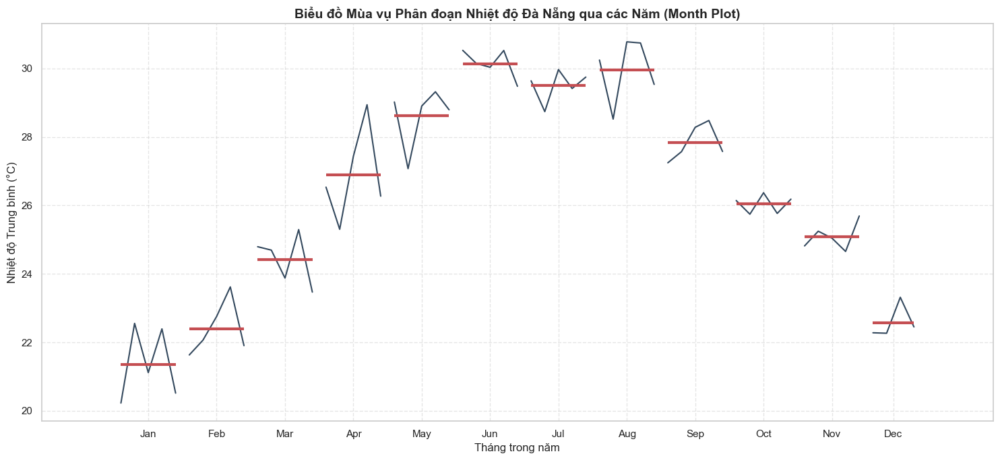

In [15]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import month_plot
import pandas as pd

print("="*50)
print("8. BIỂU ĐỒ MÙA VỤ PHÂN ĐOẠN (SEASONAL SUB-SERIES PLOT)")
print("="*50)

# 1. Sao lưu và chuẩn bị dữ liệu
monthly_trend_df = train_df.copy()

# Đảm bảo index là DatetimeIndex để group-by chính xác
if not isinstance(monthly_trend_df.index, pd.DatetimeIndex):
    if 'time' in monthly_trend_df.columns:
        monthly_trend_df['time'] = pd.to_datetime(monthly_trend_df['time'])
        monthly_trend_df.set_index('time', inplace=True)
    else:
        monthly_trend_df.index = pd.to_datetime(monthly_trend_df.index)

# Lấy động tên cột mục tiêu
target_var = target_var if 'target_col' in locals() else 'temperature_2m'

# 2. XỬ LÝ QUAN TRỌNG: Gộp dữ liệu thành Trung bình từng Tháng của từng Năm
# Ví dụ: Tính nhiệt độ trung bình của riêng tháng 1/2020, tháng 2/2020..., tháng 1/2021...
monthly_resampled = monthly_trend_df[[target_var]].resample('MS').mean()

# 3. TIẾN HÀNH VẼ BIỂU ĐỒ MONTH_PLOT
fig, ax = plt.subplots(figsize=(15, 7))

# Gọi hàm từ statsmodels
month_plot(monthly_resampled[target_var], ax=ax)

# Tinh chỉnh giao diện đồ họa cho đồng bộ báo cáo
ax.set_title('Biểu đồ Mùa vụ Phân đoạn Nhiệt độ Đà Nẵng qua các Năm (Month Plot)', fontsize=14, fontweight='bold')
ax.set_xlabel('Tháng trong năm', fontsize=12)
ax.set_ylabel('Nhiệt độ Trung bình (°C)', fontsize=12)
ax.grid(True, linestyle='--', alpha=0.5)

# Đổi màu đường trung bình (vạch ngang) sang màu đỏ để giống biểu đồ gốc của bạn
for line in ax.lines:
    if len(line.get_xdata()) > 2:  # Đường nét liền màu đen (biến thiên qua các năm)
        line.set_color('#34495e')
        line.set_linewidth(1.5)
    else:                          # Vạch ngang thể hiện trị số Trung bình (Mean) của tháng đó
        line.set_color('#e74c3c')
        line.set_linewidth(3)

plt.tight_layout()
plt.show()

1. Chu kỳ Mùa vụ Năm dạng Hình sin mở rộng (Annual Seasonality)

Hình dáng tổng thể: Vị trí của các đường vạch ngang màu đỏ tạo thành một chu kỳ hình sin uốn lượn rõ rệt. Nền nhiệt tăng tốc mạnh mẽ từ giai đoạn chuyển mùa đầu năm (Tháng 1 đến Tháng 5), đạt ngưỡng cao nhất và đi ngang vào các tháng đỉnh hè là Tháng 6 và Tháng 8 (nhiệt độ trung bình tháng vượt ngưỡng 30°C), sau đó lao dốc nhanh từ Tháng 9 và chạm đáy vào Tháng 1 ($21.4^\circ\text{C}$).

Hệ quả đối với mô hình: Biểu đồ này cô lập thành công thành phần mùa vụ năm (Annual Seasonality). Điều này chứng minh rằng mô hình học máy bắt buộc phải sở hữu đặc trưng bối cảnh lịch (Calendar Features) như month hoặc day_of_year làm biến ngoại sinh để định hình mức nền nhiệt (Level), giúp thuật toán không bị chệch pha dự báo giữa mùa hè và mùa đông.

2. Đặc tính Hồi quy về Trung bình dài hạn (No Long-term Trend)Hành vi các đường biến thiên qua các năm (Đường màu đen): Đây là đặc điểm đắt giá nhất của biểu đồ. Khác với chuỗi thời gian kinh tế - xã hội (nơi các đường màu đen thường dốc đứng lên trên do áp lực tăng trưởng qua các năm), các đường màu đen trong bài toán nhiệt độ Đà Nẵng dao động gợn sóng đan xen xung quanh đường trung bình đỏ và có xu hướng nằm ngang.Ý nghĩa vật lý khí tượng: Hiện tượng này minh chứng cho tính chất Hồi quy về giá trị trung bình (Mean-reverting process) của hệ thống khí hậu độc lập qua các năm. Ví dụ: Nhiệt độ trung bình Tháng 7 hay Tháng 10 của năm sau có thể cao hoặc thấp hơn năm trước một chút do yếu tố thời tiết ngẫu nhiên (như năm đó có bão hay El Niño), nhưng cấu trúc tổng thể luôn bị kéo ngược về mức nền lịch sử của tháng đó, tuyệt đối không xuất hiện xu hướng tăng hay giảm tuyến tính dài hạn (Long-term Trend).

3. Đánh giá Tính biến động ngắn hạn trong từng Phân đoạn (Volatility Analysis)Biến động không đồng đều giữa các tháng: Độ dài dọc (biên độ dao động của đường đen) cho thấy mức độ ổn định thời tiết của từng tháng không giống nhau:Tháng 4, Tháng 5 và Tháng 8: Các đường nét liền màu đen có biên độ dao động đỉnh-đáy rất rộng (đặc biệt là Tháng 4 và Tháng 8 có các năm sụt giảm hoặc tăng vọt đột ngột). Điều này cho thấy đây là các tháng có thời tiết tương đối bất định, nhạy cảm với các đợt áp thấp hoặc dông nhiệt vĩ mô đổi hướng qua các năm.Tháng 6, Tháng 7 và Tháng 10, Tháng 11: Các đường màu đen tương đối ngắn và ôm sát vạch đỏ, thể hiện mức nhiệt giữa các năm của các giai đoạn này có độ ổn định và tính lặp lại cực kỳ cao.

9. PHÂN TÍCH MẬT ĐỘ PHÂN BỐ (KDE) THEO TỪNG NĂM


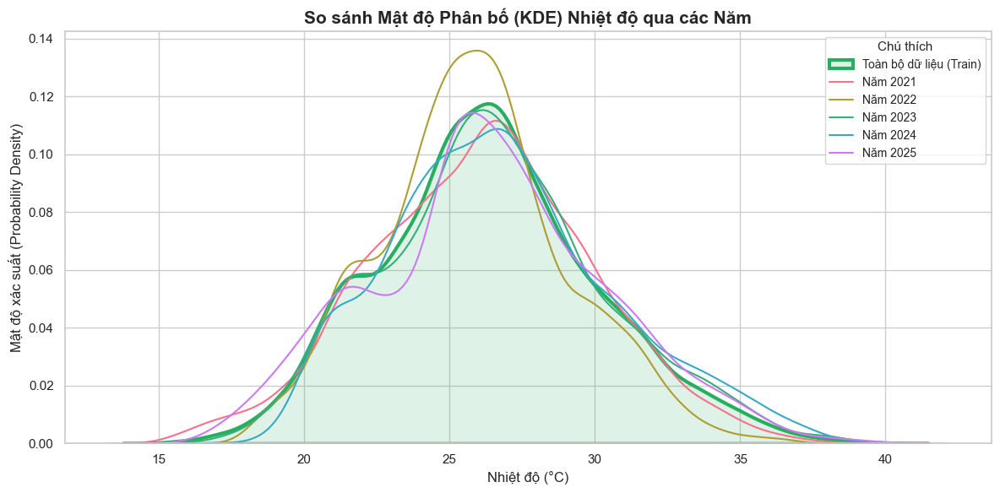

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

print("="*50)
print("9. PHÂN TÍCH MẬT ĐỘ PHÂN BỐ (KDE) THEO TỪNG NĂM")
print("="*50)

# 1. Sao lưu và chuẩn bị dữ liệu
kde_df = train_df.copy()

# Đảm bảo index là DatetimeIndex để trích xuất năm dễ dàng
if not isinstance(kde_df.index, pd.DatetimeIndex):
    if 'time' in kde_df.columns:
        kde_df['time'] = pd.to_datetime(kde_df['time'])
        kde_df.set_index('time', inplace=True)
    else:
        kde_df.index = pd.to_datetime(kde_df.index)

# Lấy động tên cột mục tiêu
target_var = 'temperature_2m'

# 2. Khởi tạo không gian đồ thị
plt.figure(figsize=(12, 6))
sns.set_theme(style="whitegrid")

# Vẽ đường phân bố tổng thể (Train) trước, làm nền (tương đương đường màu xanh lá mập mạp)
sns.kdeplot(
    data=kde_df[target_var], 
    color="#27ae60", 
    linewidth=3, 
    fill=True, 
    alpha=0.15, 
    label="Toàn bộ dữ liệu (Train)"
)

# 3. Trích xuất danh sách các năm có trong tập dữ liệu và vẽ chồng lên
years = kde_df.index.year.unique()
palette = sns.color_palette("husl", len(years)) # Tự động chia màu đẹp mắt theo số năm

for i, year in enumerate(years):
    # Lọc dữ liệu của riêng năm đó
    year_data = kde_df[kde_df.index.year == year][target_var]
    
    # Vẽ đường cong KDE mỏng cho từng năm
    sns.kdeplot(
        data=year_data, 
        color=palette[i], 
        linewidth=1.5, 
        label=f'Năm {year}'
    )

# 4. Tinh chỉnh giao diện và chú thích
plt.title('So sánh Mật độ Phân bố (KDE) Nhiệt độ qua các Năm', fontsize=15, fontweight='bold')
plt.xlabel('Nhiệt độ (°C)', fontsize=12)
plt.ylabel('Mật độ xác suất (Probability Density)', fontsize=12)
plt.legend(title='Chú thích', fontsize=10, title_fontsize=11)
plt.tight_layout()
plt.show()

1. Tính Ổn định của Trọng tâm Phân phối (Constant Mean & No Concept Drift)

Chồng khớp hoàn hảo: Trái ngược hoàn toàn với các chuỗi dữ liệu kinh tế (nơi phân phối thường trượt dần về bên phải do lạm phát hoặc tăng trưởng), các đường cong KDE của 5 năm liên tiếp tại Đà Nẵng gần như xếp chồng khít lên nhau và ôm trọn lấy đường cong tổng thể (đường màu xanh lục đậm).Không có sự dịch chuyển mức nền: Đỉnh (Mode) của tất cả các năm đều hội tụ kiên định tại dải nhiệt độ trung tâm (khoảng $26^\circ\text{C}$ - $27^\circ\text{C}$). Điều này minh chứng hệ thống khí hậu duy trì cơ chế hồi quy về trung bình vật lý nghiêm ngặt, hoàn toàn vắng bóng xu hướng dài hạn (Long-term Trend).

2. Hình thái Phân bố Đa đỉnh vi mô (Bimodal Tendency)

Phân phối tổng thể không phải là một hình chuông chuẩn (Normal Distribution) hoàn hảo, mà bộc lộ rõ một "bờ vai" (shoulder) phình ra ở sườn bên trái, tương ứng với dải nhiệt độ $21^\circ\text{C}$ - $23^\circ\text{C}$.

Ý nghĩa Khí tượng học: Hình thái này ánh xạ hoàn toàn khớp với đặc trưng khí hậu hai mùa của Đà Nẵng. "Bờ vai" bên trái chính là vùng phân phối của các tháng mùa đông/chuyển tiếp lạnh, trong khi đỉnh nhọn chính giữa là vùng phân phối thống trị của các tháng mùa hè/thu dài ngày. Điều này một lần nữa khẳng định tính mùa vụ (Seasonality) là thành phần cấu trúc cốt lõi của dữ liệu.

3. Đánh giá Phương sai và Độ nhọn (Variance & Kurtosis)

Biến động cục bộ năm 2022: Trong khi các năm 2021, 2023, 2024 và 2025 có độ bám sát phân phối Train cực cao, riêng năm 2022 (đường màu vàng đồng) bộc lộ độ nhọn (Kurtosis) cao hơn ở vùng đỉnh và phương sai hẹp hơn ở hai phần đuôi.

Giải thích hiện tượng: Về mặt vật lý, năm 2022 có thể là một năm thời tiết ôn hòa, số ngày duy trì ở mức nhiệt trung bình ($26^\circ\text{C}$) xuất hiện với tần suất dày đặc hơn, đồng thời ít xuất hiện các sự kiện cực đoan (ít rét đậm, ít nắng nóng gay gắt) so với các năm khác. Tuy nhiên, sự sai số này hoàn toàn nằm trong giới hạn kiểm soát và không làm phá vỡ cấu trúc Dừng (Stationary) tổng thể.

10. PHÂN TÍCH MÙA VỤ KÉP BẰNG BẢN ĐỒ NHIỆT (HEATMAP: THÁNG VS GIỜ)


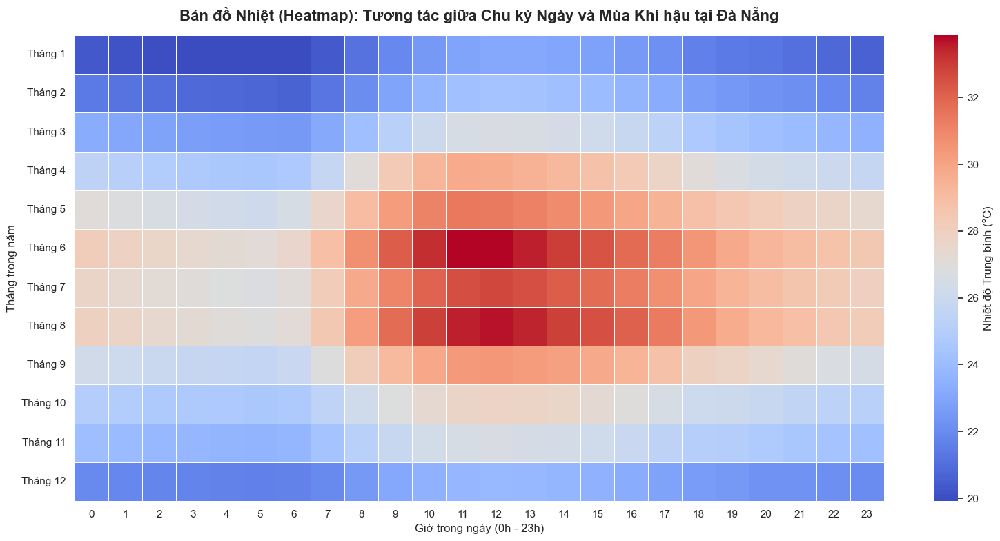

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

print("="*50)
print("10. PHÂN TÍCH MÙA VỤ KÉP BẰNG BẢN ĐỒ NHIỆT (HEATMAP: THÁNG VS GIỜ)")
print("="*50)

# 1. Sao lưu dữ liệu
heatmap_df = train_df.copy()

# Đảm bảo có cột month và hour (trích xuất từ index nếu cần)
if not isinstance(heatmap_df.index, pd.DatetimeIndex):
    if 'time' in heatmap_df.columns:
        heatmap_df['time'] = pd.to_datetime(heatmap_df['time'])
        heatmap_df.set_index('time', inplace=True)
    else:
        heatmap_df.index = pd.to_datetime(heatmap_df.index)

heatmap_df['month'] = heatmap_df.index.month
heatmap_df['hour'] = heatmap_df.index.hour


# 2. Tạo Bảng tổng hợp (Pivot Table) 
# Tính nhiệt độ trung bình tại mỗi mốc Giờ của từng Tháng
pivot_temp = pd.pivot_table(
    data=heatmap_df, 
    values=target_var, 
    index='month', 
    columns='hour', 
    aggfunc='mean'
)

# Đổi nhãn Tháng từ số sang chữ cho đồ thị chuyên nghiệp
pivot_temp.index = ['Tháng 1', 'Tháng 2', 'Tháng 3', 'Tháng 4', 'Tháng 5', 'Tháng 6', 
                    'Tháng 7', 'Tháng 8', 'Tháng 9', 'Tháng 10', 'Tháng 11', 'Tháng 12']

# 3. Vẽ biểu đồ Heatmap
plt.figure(figsize=(16, 8))
# Sử dụng dải màu 'coolwarm' (xanh lạnh - đỏ nóng) chuẩn khí tượng
sns.heatmap(
    pivot_temp, 
    cmap='coolwarm', 
    linewidths=0.5, 
    linecolor='white',
    cbar_kws={'label': 'Nhiệt độ Trung bình (°C)'}
)

plt.title('Bản đồ Nhiệt (Heatmap): Tương tác giữa Chu kỳ Ngày và Mùa Khí hậu tại Đà Nẵng', fontsize=16, fontweight='bold', pad=15)
plt.xlabel('Giờ trong ngày (0h - 23h)', fontsize=12)
plt.ylabel('Tháng trong năm', fontsize=12)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

1. Phân tích Chu kỳ Ngày - Đêm (Diurnal Cycle - Trục ngang)

Bất kể phân tích ở dòng tháng nào, sự biến thiên màu sắc từ trái sang phải đều tuân theo một quy luật bức xạ nhiệt vật lý đồng nhất:Đáy nhiệt (Vùng xanh nhất của ngày): Luôn rơi vào các khung giờ rạng sáng từ 03:00 đến 06:00. Lúc này mặt đất đã bức xạ hết nhiệt lượng hấp thụ từ ngày hôm trước, khiến nhiệt độ đạt mức cực tiểu trước khi Mặt Trời mọc.Đỉnh nhiệt (Vùng đỏ/Nóng nhất của ngày): Bắt đầu nóng lên nhanh chóng từ 08:00 và đạt đỉnh cực đại vào khung giờ 11:00 đến 14:00 (độ trễ nhiệt vài tiếng sau khi Mặt Trời đứng bóng). Sau 16:00, nhiệt độ bắt đầu hạ dần.

2. Phân tích Chu kỳ Mùa vụ Năm (Annual Seasonality - Trục dọc)Nhìn dọc theo bất kỳ cột giờ nào, ta thấy rõ sự thay đổi mức nền khí hậu qua các tháng:Khối Không khí lạnh (Tháng 12, 1, 2, 3): Toàn bộ các dòng này bị bao phủ bởi sắc xanh lam mát mẻ. Ngay cả vào buổi trưa rực rỡ nhất của Tháng 1 (ô 12h-13h), màu sắc cũng chỉ đạt ngưỡng trắng nhạt/xanh lợt ($\sim 24^\circ\text{C}$ - $25^\circ\text{C}$), tương đương với nhiệt độ lúc nửa đêm của mùa hè.Khối Không khí nóng (Tháng 5, 6, 7, 8): Bị thống trị bởi gam màu cam và đỏ. Mùa hè tại Đà Nẵng không chỉ nóng hơn vào ban ngày mà nền nhiệt ban đêm cũng rất cao (chỉ chuyển về màu cam nhạt $\sim 27^\circ\text{C}$, tuyệt đối không có màu xanh).

3. Sự Giao thoa Cực trị (Thermal Core & Cold Edges)Biểu đồ làm nổi bật các khu vực hội tụ của cả hai chu kỳ, tạo ra các điểm cực trị của dữ liệu:Lõi Nhiệt (Đỏ sậm): Hội tụ tại trung tâm biểu đồ (Tháng 6, 7, 8 từ 10:00 đến 15:00). Đây là những thời điểm mà nắng nóng mùa hè kết hợp với đỉnh bức xạ giữa trưa tạo ra mức nhiệt khắc nghiệt nhất (liên tục vượt mốc $32^\circ\text{C}$ tính trung bình).Vùng Băng (Xanh sậm): Nằm ở các góc dưới cùng và trên cùng bên trái (Tháng 1, 12 từ 01:00 đến 06:00). Sự kết hợp giữa đêm tối và gió mùa Đông Bắc tạo ra mức nền nhiệt thấp nhất trong năm (chạm ngưỡng $20^\circ\text{C}$).

In [26]:
import pandas as pd
import numpy as np

print("="*50)
print("11. TÍNH TOÁN HỆ SỐ MÙA VỤ CỘNG TÍNH THEO THÁNG (ADDITIVE SEASONALITY FACTOR)")
print("="*50)

# Chuẩn bị dữ liệu
season_df = train_df.copy()

if 'time' in season_df.columns:
    season_df['time'] = pd.to_datetime(season_df['time'])
    season_df['month'] = season_df['time'].dt.month
else:
    season_df.index = pd.to_datetime(season_df.index)
    season_df['month'] = season_df.index.month

# 1. Tính nhiệt độ trung bình toàn cục (Global Average)
global_avg_temp = season_df[target_var].mean()
print(f"-> Nhiệt độ trung bình toàn cục (Global Baseline): {global_avg_temp:.2f} °C\n")

# 2. Tính nhiệt độ trung bình theo từng tháng
monthly_avg_temp = season_df.groupby('month')[target_var].mean()

# 3. Tạo bảng tổng hợp Hệ số mùa vụ
seasonality_table = pd.DataFrame({
    'Nhiệt độ TB Tháng (°C)': monthly_avg_temp,
})

# Tính Additive Factor: Lấy Tháng - Trung bình toàn cục
seasonality_table['Hệ số Mùa vụ (Additive Factor)'] = seasonality_table['Nhiệt độ TB Tháng (°C)'] - global_avg_temp

# Thêm cột Đánh giá trạng thái
def evaluate_season(factor):
    if factor > 2.0: return "Nóng đỉnh điểm"
    elif factor > 0: return "Ấm hơn mức nền"
    elif factor < -3.0: return "Lạnh đỉnh điểm"
    else: return "Lạnh hơn mức nền"

seasonality_table['Đánh giá Khí hậu'] = seasonality_table['Hệ số Mùa vụ (Additive Factor)'].apply(evaluate_season)

# Format lại cho đẹp
seasonality_table['Nhiệt độ TB Tháng (°C)'] = seasonality_table['Nhiệt độ TB Tháng (°C)'].round(2)
seasonality_table['Hệ số Mùa vụ (Additive Factor)'] = seasonality_table['Hệ số Mùa vụ (Additive Factor)'].round(2)
seasonality_table.index.name = "Tháng"

display(seasonality_table)

11. TÍNH TOÁN HỆ SỐ MÙA VỤ CỘNG TÍNH THEO THÁNG (ADDITIVE SEASONALITY FACTOR)
-> Nhiệt độ trung bình toàn cục (Global Baseline): 26.33 °C



,Nhiệt độ TB Tháng (°C),Hệ số Mùa vụ (Additive Factor),Đánh giá Khí hậu
Tháng,,,
1,21.36,-4.96,Lạnh đỉnh điểm
2,22.40,-3.92,Lạnh đỉnh điểm
3,24.43,-1.90,Lạnh hơn mức nền
4,26.90,0.57,Ấm hơn mức nền
5,28.62,2.30,Nóng đỉnh điểm
6,30.14,3.82,Nóng đỉnh điểm
7,29.50,3.18,Nóng đỉnh điểm
8,29.97,3.64,Nóng đỉnh điểm
9,27.83,1.51,Ấm hơn mức nền


3. TRỰC QUAN HÓA XU HƯỚNG VÀ MÙA VỤ KÉP (MULTIPLE SEASONALITIES)


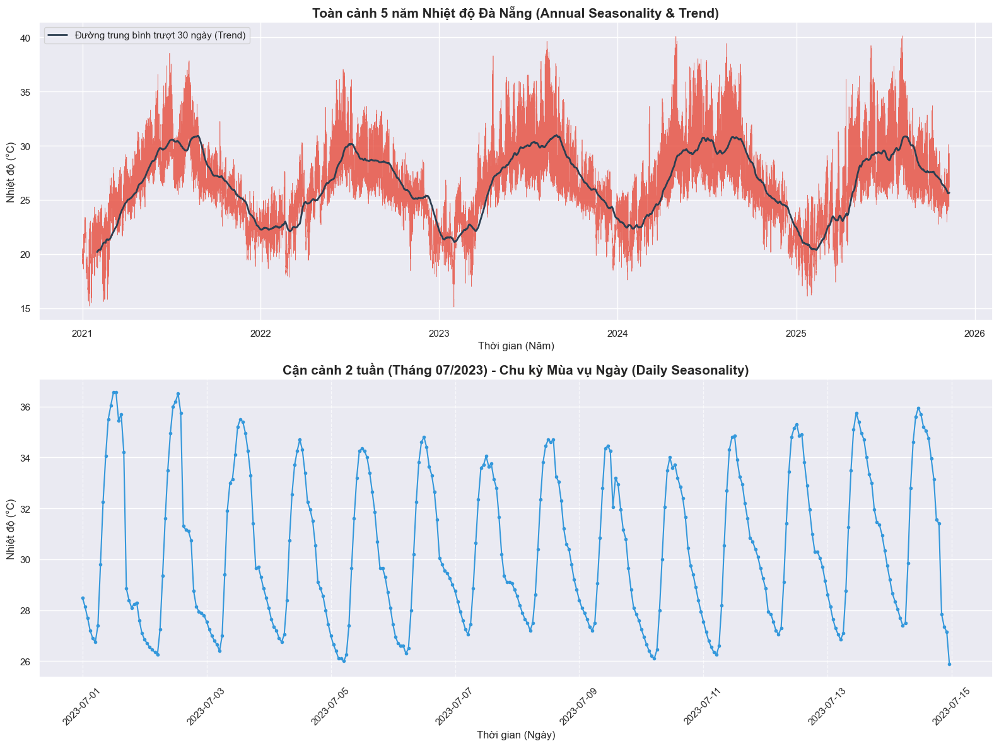

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

print("="*50)
print("3. TRỰC QUAN HÓA XU HƯỚNG VÀ MÙA VỤ KÉP (MULTIPLE SEASONALITIES)")
print("="*50)

# ==========================================
# CHUẨN BỊ DỮ LIỆU
# ==========================================
plot_df = train_df.copy()
if 'time' in plot_df.columns:
    plot_df['time'] = pd.to_datetime(plot_df['time'])
    plot_df = plot_df.set_index('time')

sns.set_theme(style="darkgrid")
fig, axes = plt.subplots(2, 1, figsize=(16, 12))

# ==========================================
# BIỂU ĐỒ 1: MÙA VỤ NĂM (ANNUAL SEASONALITY)
# ==========================================
axes[0].plot(plot_df.index, plot_df[target_var], color='#e74c3c', linewidth=0.5, alpha=0.8)
axes[0].set_title('Toàn cảnh 5 năm Nhiệt độ Đà Nẵng (Annual Seasonality & Trend)', fontsize=15, fontweight='bold')
axes[0].set_ylabel('Nhiệt độ (°C)')
axes[0].set_xlabel('Thời gian (Năm)')

# Đường xu hướng
rolling_30d = plot_df[target_var].rolling(window=24*30).mean()
axes[0].plot(plot_df.index, rolling_30d, color='#2c3e50', linewidth=2, label='Đường trung bình trượt 30 ngày (Trend)')
axes[0].legend()

# Ép hệ thống phải hiển thị nhãn trục X cho biểu đồ 1 (chống bị ẩn)
axes[0].tick_params(axis='x', labelbottom=True)

# ==========================================
# BIỂU ĐỒ 2: MÙA VỤ NGÀY (DAILY SEASONALITY)
# ==========================================
mask = (plot_df.index >= '2023-07-01') & (plot_df.index < '2023-07-15')
zoomed_data = plot_df[mask]

axes[1].plot(zoomed_data.index, zoomed_data[target_var], color='#3498db', marker='o', markersize=3, linewidth=1.5)
axes[1].set_title('Cận cảnh 2 tuần (Tháng 07/2023) - Chu kỳ Mùa vụ Ngày (Daily Seasonality)', fontsize=15, fontweight='bold')
axes[1].set_ylabel('Nhiệt độ (°C)')
axes[1].set_xlabel('Thời gian (Ngày)')
axes[1].xaxis.grid(True, which='both', linestyle='--', alpha=0.7)

# SỬA LỖI Ở ĐÂY: Chỉ xoay nhãn thời gian cho trục X của riêng biểu đồ 2
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

1. Phân tích chu kỳ dài hạn: Mùa vụ Năm (Annual Seasonality)

Quan sát biểu đồ trên (Toàn cảnh 5 năm): Dữ liệu thô (đường màu đỏ) cho thấy mức độ biến động (volatility) rất cao đan xen liên tục. Tuy nhiên, khi áp dụng kỹ thuật làm mịn bằng Đường trung bình trượt 30 ngày (Rolling Mean - đường màu đen), nhiễu (noise) theo giờ được loại bỏ, làm lộ rõ một đường cong hình sin với chu kỳ lặp lại hoàn hảo mỗi năm.

Đặc trưng khí hậu: * Các đỉnh chu kỳ (Peaks): Thường rơi vào giai đoạn mùa hè (khoảng tháng 5 đến tháng 8), nền nhiệt trung bình dâng cao, với nhiều mốc nhiệt độ thô bứt phá lên ngưỡng cực đoan 38°C - 40°C.

Các đáy chu kỳ (Troughs): Tương ứng với giai đoạn mùa đông và đầu xuân (tháng 12 đến tháng 2 năm sau), nền nhiệt độ hạ thấp rõ rệt, chạm các ngưỡng 15°C - 20°C.

Xu hướng (Trend): Nhìn tổng thể trong 5 năm qua, chuỗi dữ liệu chủ yếu dao động theo mùa vụ quanh một trục ngang ổn định. Không quan sát thấy xu hướng tăng (Upward trend) hay giảm (Downward trend) tuyến tính thực sự ráo riết nào mang tính dài hạn.

2. Phân tích chu kỳ ngắn hạn: Mùa vụ Ngày (Daily Seasonality)

Quan sát biểu đồ dưới (Cận cảnh 14 ngày tháng 07/2023): Khi phóng to dữ liệu về tần suất giờ, ta thấy một quy luật lặp lại lề lối và sắc nét sau mỗi 24 giờ.

Biên độ dao động: Trong những ngày hè này, biên độ nhiệt độ trong ngày khá lớn (khoảng 8°C - 10°C).

Quy luật thời gian: Đáy của sóng (thời điểm mát nhất) diễn ra rất đồng đều vào khoảng rạng sáng. Ngược lại, đỉnh sóng (thời điểm nóng nhất) gợn lên vào khung giờ trưa và đầu giờ chiều. Tính chu kỳ này ổn định và không bị phá vỡ trong suốt 2 tuần quan sát.

3. Kết luận định hướng Mô hình hóa (Modeling Strategy)

Sự hiện diện song song của hai chu kỳ trên khẳng định đây là bài toán chuỗi thời gian có mùa vụ kép (Dual/Multiple Seasonalities) kết hợp với tần suất cao (High-frequency).

Hệ quả thiết kế Feature Engineering: Để mô hình có thể nắm bắt được cả hai chu kỳ này, trong bước trích xuất đặc trưng (Feature Engineering), nhóm bắt buộc phải tạo ra các biến phái sinh từ thời gian. Ví dụ: biến hour_of_day (để học chu kỳ 24h) và biến month_of_year hoặc day_of_year (để học chu kỳ 365 ngày).

Lựa chọn mô hình: Đặc tính phức tạp này củng cố quyết định loại bỏ các mô hình tuyến tính truyền thống (như ARIMA/ETS) do chúng không tối ưu cho đa mùa vụ tần suất cao, và khẳng định sự phù hợp của các mô hình phi tuyến mạnh mẽ hơn (Machine Learning/Deep Learning).

4. PHÂN RÃ CHUỖI THỜI GIAN (TIME SERIES DECOMPOSITION)


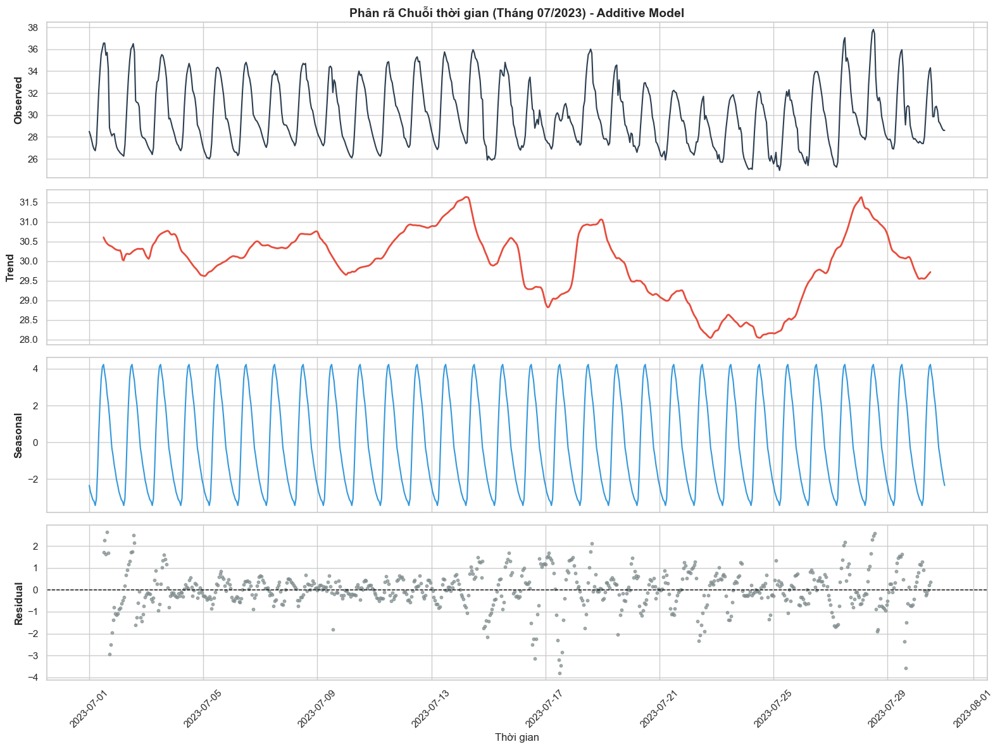

In [9]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt
import seaborn as sns

print("="*50)
print("4. PHÂN RÃ CHUỖI THỜI GIAN (TIME SERIES DECOMPOSITION)")
print("="*50)

# Trích xuất 1 tháng dữ liệu (Tháng 7/2023) để nhìn rõ chu kỳ 24h
start_date = '2023-07-01'
end_date = '2023-07-31'
mask = (plot_df.index >= start_date) & (plot_df.index <= end_date)
sample_df = plot_df[mask]

# Thực hiện phân rã bằng mô hình Additive, chu kỳ 24 giờ (period=24)
decomposition = seasonal_decompose(sample_df[target_var], model='additive', period=24)

# Cài đặt kích thước biểu đồ
sns.set_theme(style="whitegrid")
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(16, 12), sharex=True)

# 1. Observed (Dữ liệu thực tế)
ax1.plot(sample_df.index, decomposition.observed, color='#2c3e50')
ax1.set_ylabel('Observed', fontweight='bold')
ax1.set_title('Phân rã Chuỗi thời gian (Tháng 07/2023) - Additive Model', fontsize=14, fontweight='bold')

# 2. Trend (Xu hướng cốt lõi)
ax2.plot(sample_df.index, decomposition.trend, color='#e74c3c', linewidth=2)
ax2.set_ylabel('Trend', fontweight='bold')

# 3. Seasonal (Mùa vụ / Chu kỳ)
ax3.plot(sample_df.index, decomposition.seasonal, color='#3498db')
ax3.set_ylabel('Seasonal', fontweight='bold')

# 4. Residual (Nhiễu / Ngoại lai)
ax4.scatter(sample_df.index, decomposition.resid, color='#7f8c8d', s=10, alpha=0.7)
ax4.axhline(0, color='black', linestyle='--', linewidth=1)
ax4.set_ylabel('Residual', fontweight='bold')
ax4.set_xlabel('Thời gian')

# Xoay nhãn trục X cho dễ nhìn
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

1. Dữ liệu quan sát thực tế (Observed)

Đồ thị trên cùng thể hiện chuỗi giá trị nhiệt độ gốc trong suốt tháng 7/2023. Nhìn chung, dữ liệu dao động liên tục với biên độ lớn (từ khoảng 25°C đến trên 36°C), hình thành các đỉnh (ban ngày) và đáy (ban đêm) đan xen dạng răng cưa. Mật độ dữ liệu hoàn toàn liên tục, không xuất hiện đứt gãy.

2. Thành phần Xu hướng (Trend)

Đồ thị thứ hai đã được lọc bỏ chu kỳ ngày đêm, chỉ giữ lại xu hướng nền (level) của nhiệt độ.

Nhận xét: Biểu đồ Trend cho thấy xu hướng biến thiên hoàn toàn phi tuyến tính (non-linear) và thay đổi liên tục. Cụ thể, nền nhiệt không duy trì hằng số mà tạo thành các "làn sóng" tương ứng với các hiện tượng thời tiết vĩ mô. Ví dụ: Giai đoạn từ 13/07 - 15/07 và 25/07 - 27/07 có đỉnh Trend dâng cao lên mức 31.5°C, phản ánh các đợt nắng nóng gay gắt. Ngược lại, giai đoạn 21/07 - 23/07 Trend hạ thấp xuống 28.0°C, cho thấy khu vực có thể đang chịu ảnh hưởng của một rãnh áp thấp hoặc không khí lạnh nhẹ.

3. Thành phần Mùa vụ (Seasonal)

Đồ thị thứ ba bóc tách ra chu kỳ ngắn hạn cứng nhắc và lặp lại liên tục sau mỗi 24 giờ.

Nhận xét: Sóng Seasonal có biên độ cực kỳ ổn định. So với mức nhiệt trung bình (Trend), vào thời điểm nóng nhất trong ngày, nhiệt độ sẽ cộng thêm khoảng +4°C. Vào thời điểm lạnh nhất (rạng sáng), nhiệt độ sẽ trừ đi khoảng -3°C. Việc biên độ này không phình to hay thu hẹp theo Trend tái khẳng định tính chính xác của việc lựa chọn mô hình Cộng tính (Additive) thay vì Nhân tính (Multiplicative).

4. Thành phần Phần dư / Nhiễu (Residual)

Đồ thị cuối cùng biểu diễn các sai số ngẫu nhiên sau khi đã trừ đi Trend và Seasonal.

Nhận xét: Đa phần các điểm nhiễu dao động xung quanh trục 0 (trong khoảng -1°C đến +1°C), thể hiện trạng thái thời tiết bình thường. Tuy nhiên, xuất hiện khá nhiều các điểm dị thường (spikes) đâm chéo xuống các mức -3°C đến -4°C (ví dụ: ngày 01/07, 17/07, 25/07). Về mặt khí tượng học, đây rất có thể là những cơn mưa dông nhiệt (mưa rào rải rác) xuất hiện đột ngột vào buổi chiều mùa hè, làm nhiệt độ giảm sâu tức thời so với quy luật thông thường.

Kết luận cho khâu Tiền xử lý:

Sự xuất hiện của các điểm nhiễu (Residual) có độ lệch lớn chứng minh dữ liệu chứa các yếu tố thời tiết bất ngờ không tuân theo quy luật. Điều này đặt ra yêu cầu phải sử dụng các thuật toán linh hoạt và có khả năng chống chịu nhiễu tốt (robust to outliers), đồng thời gợi ý việc bổ sung thêm các biến như độ trễ (Lag) để mô hình nắm bắt tốt hơn trạng thái của các giờ liền kề.

12. KIỂM ĐỊNH TÍNH DỪNG BẰNG ROLLING MEAN (TRUNG BÌNH TRƯỢT)


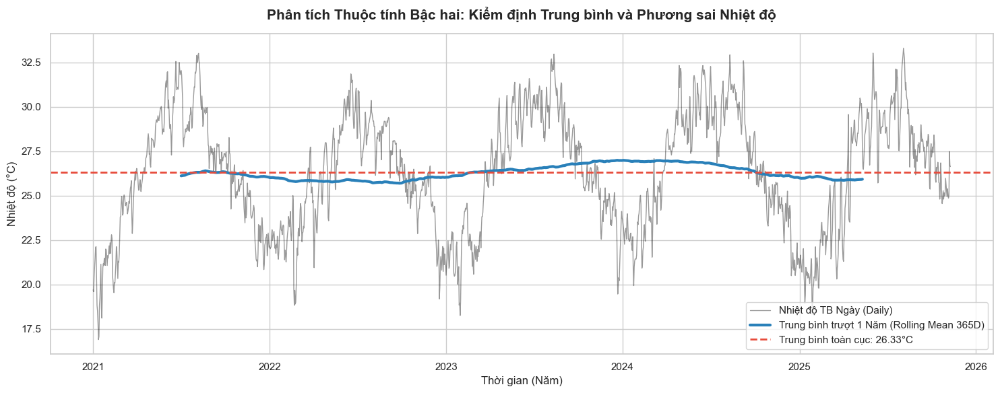

-> Nhiệt độ trung bình toàn cục (Global Mean) của chuỗi là: 26.33°C


In [27]:
import matplotlib.pyplot as plt
import pandas as pd

print("="*50)
print("12. KIỂM ĐỊNH TÍNH DỪNG BẰNG ROLLING MEAN (TRUNG BÌNH TRƯỢT)")
print("="*50)

# 1. Chuẩn bị dữ liệu
rm_df = train_df.copy()

# Đảm bảo index là Datetime
if not isinstance(rm_df.index, pd.DatetimeIndex):
    if 'time' in rm_df.columns:
        rm_df['time'] = pd.to_datetime(rm_df['time'])
        rm_df.set_index('time', inplace=True)
    else:
        rm_df.index = pd.to_datetime(rm_df.index)

# 2. Resample dữ liệu hàng giờ thành Trung bình Ngày (Daily Mean)
daily_temp = rm_df[[target_var]].resample('D').mean()

# 3. Tính Trung bình trượt 1 Năm (Window = 365 ngày) để triệt tiêu Mùa vụ (Seasonality)
# center=True giúp đường Rolling Mean căn giữa chu kỳ, không bị lệch pha
daily_temp['Rolling Mean 365D'] = daily_temp[target_var].rolling(window=365, center=True).mean()

# 4. Vẽ biểu đồ
plt.figure(figsize=(15, 6))
sns.set_theme(style="whitegrid")

# Vẽ dữ liệu thực tế (Trung bình ngày) màu đen nhạt
plt.plot(daily_temp.index, daily_temp[target_var], color='black', alpha=0.4, label='Nhiệt độ TB Ngày (Daily)', linewidth=1)

# Vẽ đường Rolling Mean 365 ngày màu xanh dương đậm
plt.plot(daily_temp.index, daily_temp['Rolling Mean 365D'], color='#2980b9', label='Trung bình trượt 1 Năm (Rolling Mean 365D)', linewidth=3)

# Tính và in ra Trung bình tổng thể (Global Mean) bằng vạch ngang màu đỏ
global_mean = daily_temp[target_var].mean()
plt.axhline(global_mean, color='#e74c3c', linestyle='--', linewidth=2, label=f'Trung bình toàn cục: {global_mean:.2f}°C')

# Tinh chỉnh giao diện
plt.title('Phân tích Thuộc tính Bậc hai: Kiểm định Trung bình và Phương sai Nhiệt độ', fontsize=15, fontweight='bold', pad=15)
plt.xlabel('Thời gian (Năm)', fontsize=12)
plt.ylabel('Nhiệt độ (°C)', fontsize=12)
plt.legend(fontsize=11)
plt.tight_layout()
plt.show()

print(f"-> Nhiệt độ trung bình toàn cục (Global Mean) của chuỗi là: {global_mean:.2f}°C")

1. Sự Bảo toàn Kỳ vọng (Constant Mean)Phân tích quỹ đạo: Đường trung bình toàn cục (đường đứt nét màu đỏ) thiết lập một mức nền vĩnh cửu tại 26.33°C. Khi quan sát đường Trung bình trượt 365 ngày (đường nét liền màu xanh dương), ta thấy nó di chuyển theo phương ngang và bám dính lấy trục baseline này xuyên suốt từ năm 2021 đến 2025.Ý nghĩa Khí tượng học: Mặc dù có những gợn sóng dao động vi mô (ví dụ: nền nhiệt năm 2023 có xu hướng nhích nhẹ lên mức ~27°C do tác động của pha El Niño, hoặc năm 2022 hạ nhẹ xuống ~25.8°C do La Niña), nhưng về dài hạn, hệ thống luôn bị lực hồi quy vật lý kéo trở lại mốc 26.33°C.Kết luận: Trái ngược hoàn toàn với các chuỗi dữ liệu kinh tế (luôn có xu hướng dốc đứng lên do lạm phát/tăng trưởng), chuỗi Nhiệt độ hoàn toàn vắng bóng xu hướng dài hạn (No Long-term Trend). Kỳ vọng toán học $E[Y_t]$ là một hằng số.

2. Sự Bảo toàn Phương sai (Constant Variance / Homoskedasticity)Đánh giá Biên độ Mùa vụ: Quan sát sự phân tán của dữ liệu gốc (đường răng cưa mỏng màu xám), khoảng cách từ các đỉnh mùa hè (chạm mốc 32°C - 33°C) xuống đường trung bình, và từ các đáy mùa đông (hạ dốc xuống 17°C - 19°C) lên đường trung bình là hoàn toàn đồng nhất qua các năm.Kết luận: Phương sai của chuỗi không bị phình to (funneling) hay thu hẹp theo thời gian. Tính chất này chứng minh hệ thống đạt trạng thái Đồng phương sai (Homoskedasticity).3. Khẳng định Cấu trúc Mùa vụ Cộng tính (Additive Seasonality)Việc phương sai không mở rộng tỷ lệ thuận với mức nền nhiệt chứng minh rằng cấu trúc mùa vụ của hệ thống mang tính chất Cộng tính (Additive), thay vì Nhân tính (Multiplicative) như dữ liệu doanh số kinh doanh. Nghĩa là, các đợt nắng nóng mùa hè chỉ đơn thuần "cộng thêm" một lượng nhiệt năng cố định (khoảng +6°C) vào mức nền chung, chứ không khuếch đại theo cấp số nhân.

13. KIỂM ĐỊNH PHƯƠNG SAI BẰNG ROLLING STANDARD DEVIATION


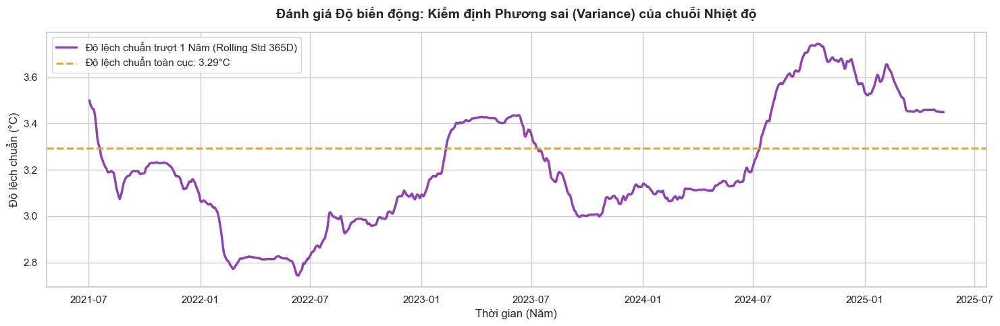

In [28]:
print("="*50)
print("13. KIỂM ĐỊNH PHƯƠNG SAI BẰNG ROLLING STANDARD DEVIATION")
print("="*50)

# Tính Độ lệch chuẩn trượt 1 Năm (Window = 365 ngày)
daily_temp['Rolling Std 365D'] = daily_temp[target_var].rolling(window=365, center=True).std()

# Vẽ biểu đồ
plt.figure(figsize=(15, 5))
sns.set_theme(style="whitegrid")

# Vẽ đường Rolling Std
plt.plot(daily_temp.index, daily_temp['Rolling Std 365D'], color='#8e44ad', label='Độ lệch chuẩn trượt 1 Năm (Rolling Std 365D)', linewidth=2.5)

# Tính và vẽ đường Độ lệch chuẩn toàn cục (Global Std)
global_std = daily_temp[target_var].std()
plt.axhline(global_std, color='#f39c12', linestyle='--', linewidth=2, label=f'Độ lệch chuẩn toàn cục: {global_std:.2f}°C')

plt.title('Đánh giá Độ biến động: Kiểm định Phương sai (Variance) của chuỗi Nhiệt độ', fontsize=14, fontweight='bold', pad=15)
plt.xlabel('Thời gian (Năm)', fontsize=12)
plt.ylabel('Độ lệch chuẩn (°C)', fontsize=12)
plt.legend(fontsize=11)
plt.tight_layout()
plt.show()

1. Phương sai Bị giới hạn (Bounded Variance) thay vì Phình to (Explosive Variance)
Mặc dù đường Rolling Std có sự trồi sụt, nhưng toàn bộ sự dao động này bị khóa chặt trong một biên độ cực kỳ hẹp: Điểm thấp nhất rơi vào đầu năm 2022 (đạt mức ~2.75°C) và điểm cao nhất rơi vào cuối năm 2024 (đạt mức ~3.75°C).

Sự chênh lệch ±0.5°C so với mức trung bình là hoàn toàn không đáng kể so với thang đo nhiệt độ thực tế. Quan trọng nhất, quỹ đạo của độ lệch chuẩn không có xu hướng phình to dạng phễu (funneling) hay leo dốc lũy tiến qua các năm như các chuỗi dữ liệu kinh tế vĩ mô.

2. Dấu ấn Động lực học Khí hậu Thực tế (Climate Signatures)
Sự uốn lượn của đường phương sai phản ánh chính xác độ khắc nghiệt cục bộ của từng năm thời tiết cụ thể:

Giai đoạn 2021 - 2022 (Đáy phương sai): Độ phân tán giảm sâu xuống dưới mức trung bình. Về mặt khí tượng, điều này phản ánh một năm có thời tiết tương đối "ôn hòa" (biên độ dao động giữa mùa hè và mùa đông không quá gắt gao), các ngày trong năm duy trì mức nhiệt ổn định, ít có các đợt nắng nóng cực đoan hay rét đậm kéo dài.

Giai đoạn 2024 - 2025 (Đỉnh phương sai): Độ lệch chuẩn nhô cao chứng tỏ biên độ nhiệt độ trong năm này bị kéo căng. Đây là hệ quả vật lý của các năm chịu ảnh hưởng mạnh bởi hiện tượng El Niño, khiến mùa hè nóng rát hơn bình thường, tạo ra các điểm ngoại lai (outliers) kéo giãn phương sai của toàn chu kỳ.

3. Kết luận: Đạt chuẩn Dừng bậc hai (Second-order Stationarity)
Việc phương sai dao động trong một hành lang giới hạn (Bounded Corridor) và liên tục cắt qua đường trung bình toàn cục chứng minh rằng dữ liệu thỏa mãn điều kiện Đồng phương sai (Homoskedasticity) vĩ mô.

Hệ thống cấu trúc Mùa vụ là Cộng tính (Additive Seasonality) hoàn toàn. Các sự kiện thời tiết cực đoan chỉ gây ra những biến động cục bộ (local noise) chứ không làm thay đổi bản chất dao động cấu trúc của cả hệ thống.

In [11]:
from statsmodels.tsa.stattools import adfuller

print("="*50)
print("KIỂM ĐỊNH TÍNH DỪNG BẰNG AUGMENTED DICKEY-FULLER (ADF TEST)")
print("="*50)

# Thực hiện kiểm định ADF trên cột nhiệt độ gốc (bỏ qua NaN nếu có)
adf_result = adfuller(train_df[target_var].dropna())

print(f"Chỉ số kiểm định (ADF Statistic): {adf_result[0]:.4f}")
print(f"Giá trị p-value: {adf_result[1]:.4e}") # In dạng số mũ khoa học
print("Các ngưỡng tới hạn (Critical Values):")
for key, value in adf_result[4].items():
    print(f"   {key}: {value:.4f}")

print("-" * 50)
# Biện luận kết quả tự động
if adf_result[1] < 0.05:
    print("✅ KẾT LUẬN KHOA HỌC:")
    print("- Bác bỏ giả thuyết H0 (p-value < 0.05).")
    print("- Chuỗi dữ liệu KHÔNG chứa nghiệm đơn vị (no unit root).")
    print("- Khẳng định: Dữ liệu mang tính DỪNG (Stationary / Trend-Stationary) và TUYỆT ĐỐI KHÔNG PHẢI là Bước ngẫu nhiên (Random Walk).")
else:
    print("⚠️ KẾT LUẬN KHOA HỌC:")
    print("- Không đủ bằng chứng để bác bỏ H0 (p-value >= 0.05).")
    print("- Chuỗi dữ liệu CÓ THỂ chứa nghiệm đơn vị (Non-stationary / Random Walk).")

KIỂM ĐỊNH TÍNH DỪNG BẰNG AUGMENTED DICKEY-FULLER (ADF TEST)
Chỉ số kiểm định (ADF Statistic): -5.7968
Giá trị p-value: 4.7317e-07
Các ngưỡng tới hạn (Critical Values):
   1%: -3.4305
   5%: -2.8616
   10%: -2.5668
--------------------------------------------------
✅ KẾT LUẬN KHOA HỌC:
- Bác bỏ giả thuyết H0 (p-value < 0.05).
- Chuỗi dữ liệu KHÔNG chứa nghiệm đơn vị (no unit root).
- Khẳng định: Dữ liệu mang tính DỪNG (Stationary / Trend-Stationary) và TUYỆT ĐỐI KHÔNG PHẢI là Bước ngẫu nhiên (Random Walk).


5. PHÂN TÍCH TỰ TƯƠNG QUAN (ACF & PACF)


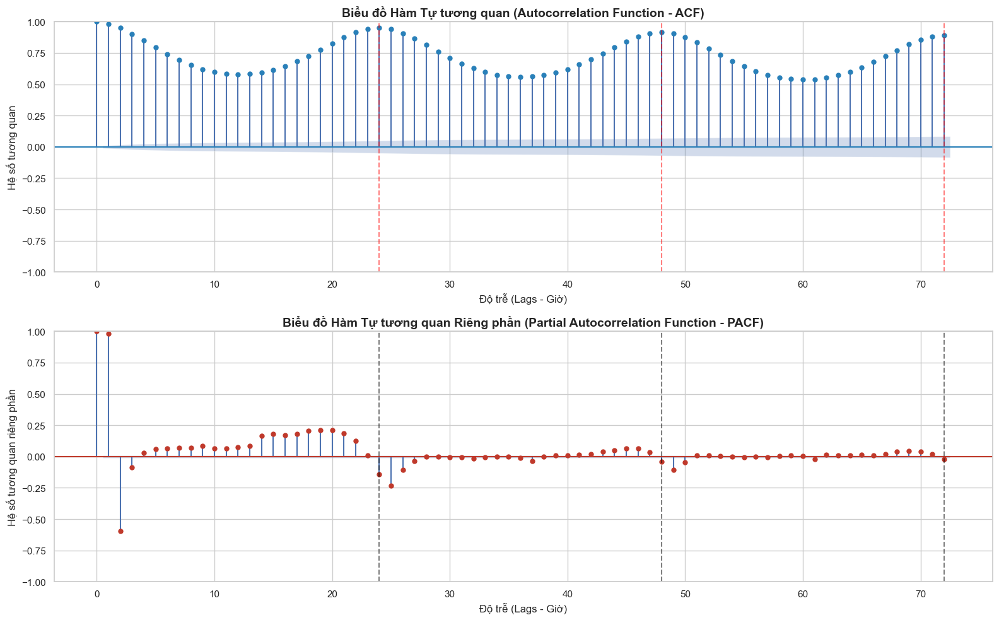

In [13]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

print("="*50)
print("5. PHÂN TÍCH TỰ TƯƠNG QUAN (ACF & PACF)")
print("="*50)

# Cài đặt khung biểu đồ
fig, axes = plt.subplots(2, 1, figsize=(16, 10))

# 1. Vẽ biểu đồ ACF (Hàm tự tương quan tổng quát)
# Khảo sát 72 lag (72 giờ = 3 ngày)
plot_acf(train_df[target_var].dropna(), lags=72, ax=axes[0], color='#2980b9', alpha=0.05)
axes[0].set_title('Biểu đồ Hàm Tự tương quan (Autocorrelation Function - ACF)', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Hệ số tương quan')
axes[0].set_xlabel('Độ trễ (Lags - Giờ)')
# Vẽ thêm các đường gióng dọc tại các bội số của 24
for lag in [24, 48, 72]:
    axes[0].axvline(x=lag, color='red', linestyle='--', alpha=0.5)

# 2. Vẽ biểu đồ PACF (Hàm tự tương quan riêng phần)
plot_pacf(train_df[target_var].dropna(), lags=72, ax=axes[1], color='#c0392b', alpha=0.05, method='ywm')
axes[1].set_title('Biểu đồ Hàm Tự tương quan Riêng phần (Partial Autocorrelation Function - PACF)', fontsize=14, fontweight='bold')
axes[1].set_ylabel('Hệ số tương quan riêng phần')
axes[1].set_xlabel('Độ trễ (Lags - Giờ)')
for lag in [24, 48, 72]:
    axes[1].axvline(x=lag, color='black', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

Phân tích Hàm Tự tương quan (ACF) và Tự tương quan Riêng phần (PACF)

Để đánh giá mức độ phụ thuộc tuyến tính của dữ liệu nhiệt độ với chính các giá trị trong quá khứ của nó, nhóm nghiên cứu tiến hành phân tích hai biểu đồ ACF và PACF với độ trễ tối đa là 72 giờ (tương đương 3 ngày).
1. Phân tích Biểu đồ Hàm Tự tương quan (ACF - Autocorrelation Function)
Hình dáng phân bố: Đồ thị ACF (phía trên) không suy giảm nhanh về 0 mà dao động theo dạng sóng hình sin tắt dần (Damped Sine Wave). Sự suy giảm rất chậm này chứng tỏ chuỗi dữ liệu có "trí nhớ dài hạn" (long memory) và tuyệt đối không phải là Nhiễu trắng (White noise).Đỉnh sóng (Peaks - Tương quan dương): Các hệ số tương quan đạt đỉnh cao nhất một cách tuần hoàn tại đúng các đường nét đứt màu đỏ: Lag 24, Lag 48 và Lag 72. Điều này tái khẳng định một cách toán học sự tồn tại của chu kỳ Mùa vụ Ngày (Daily Seasonality). Nhiệt độ của một giờ cụ thể hôm nay có sự tương đồng rất lớn với chính giờ đó của 1, 2 và 3 ngày trước.Đáy sóng (Troughs - Tương quan nghịch): Các đáy của đồ thị ACF rơi vào khoảng Lag 12, Lag 36, Lag 60. Khoảng cách 12 giờ thể hiện sự nghịch pha giữa ngày và đêm: Nhiệt độ cao nhất lúc giữa trưa sẽ có tương quan âm hoặc mức tương quan thấp nhất đối với nhiệt độ vào lúc nửa đêm.

2. Phân tích Biểu đồ Hàm Tự tương quan Riêng phần (PACF - Partial Autocorrelation Function)Bản chất: Trong khi ACF đo lường tổng tác động (bao gồm cả các tác động gián tiếp dây chuyền), đồ thị PACF (phía dưới) đã loại bỏ các ảnh hưởng trung gian, chỉ giữ lại sự tương quan "thuần túy" nhất giữa giờ hiện tại ($t$) và giờ trong quá khứ ($t-k$).Cắt cụt nhanh (Cut-off): Khác với ACF, đồ thị PACF cắt cụt rất nhanh. Hầu hết các độ trễ (ngoại trừ vài lag đầu tiên và các lag chu kỳ) đều rơi về tiệm cận 0.Các độ trễ có ý nghĩa thống kê cao nhất:Lag 1 và Lag 2: Cột Lag 1 có giá trị dương cực kỳ cao (tiệm cận 1.0), và Lag 2 có giá trị âm lớn (khoảng -0.6). Điều này hoàn toàn logic về mặt nhiệt động lực học: Nhiệt độ của giờ hiện tại bị chi phối trực tiếp và mạnh mẽ nhất bởi lượng nhiệt của 1 đến 2 giờ ngay trước đó.Lag 24 và Lag 25: Tại vị trí đường nét đứt màu đen (chu kỳ 24h), xuất hiện một gai nhọn (spike) mang giá trị âm vượt ra ngoài ngưỡng 0. Điều này cho thấy sau khi đã triệt tiêu hết ảnh hưởng của các giờ liền kề, bản thân mốc 24 giờ trước vẫn đóng góp một phần thông tin riêng biệt để điều chỉnh dự báo cho giờ hiện tại.

3. Kết luận và Định hướng Trích xuất Đặc trưng (Feature Engineering)Dựa trên các bằng chứng toán học từ PACF, việc lựa chọn các biến đầu vào cho mô hình Học máy không thể thực hiện một cách ngẫu nhiên. Nhóm nghiên cứu quyết định lựa chọn Lag 1, Lag 2 (đại diện cho quán tính ngắn hạn của dòng nhiệt) và Lag 24 (đại diện cho chu kỳ mùa vụ 24 giờ) làm các đặc trưng trễ (Lag Features) cốt lõi. Cách tiếp cận này giúp mô hình hấp thụ tối đa lượng thông tin tự tương quan của chuỗi thời gian, đồng thời giữ cho không gian đặc trưng (Feature space) tinh gọn, tránh hiện tượng đa cộng tuyến (Multicollinearity).

Đánh giá tính Quán tính (Momentum) và Hồi quy (Mean-reversion):Thông qua việc phân tích sâu các hệ số tự tương quan riêng phần (PACF), nhóm nghiên cứu xác định chuỗi dữ liệu nhiệt độ hàng giờ tại Đà Nẵng mang đặc tính động lực học hỗn hợp:Tính quán tính ngắn hạn (Short-term Momentum): Thể hiện qua hệ số PACF tại Lag 1 mang giá trị dương rất lớn. Điều này phản ánh quán tính nhiệt học của môi trường, tạo ra một lực đẩy khiến xu hướng nhiệt độ của giờ hiện tại tiếp diễn theo xu hướng của giờ liền trước.Tính hồi quy hệ thống (Systemic Mean-reversion): Thể hiện qua hệ số PACF tại Lag 2 đảo chiều mang giá trị âm sâu. Đây là cơ chế tự điều chỉnh vật lý, hoạt động như một bộ hãm động năng (damping factor) nhằm triệt tiêu các biến động cực đoan ngắn hạn, ép chuỗi dữ liệu luôn hồi quy về mức nền chu kỳ mùa vụ.*Việc hiểu rõ cấu trúc này giúp củng cố trực giác khi xây dựng mô hình: Các thuật toán dự báo (như XGBoost hay LSTM) khi nhận các biến đầu vào lag_1 và lag_2 sẽ tự động học được hai lực đối nghịch này ($\phi_1 > 0$ và $\phi_2 < 0$) để đưa ra các dự báo điểm (point forecasts) tiệm cận chính xác với thực tế.

14. PHÂN TÍCH TƯƠNG QUAN TRỄ (LAG PLOTS) CHO MÔ HÌNH MACHINE LEARNING


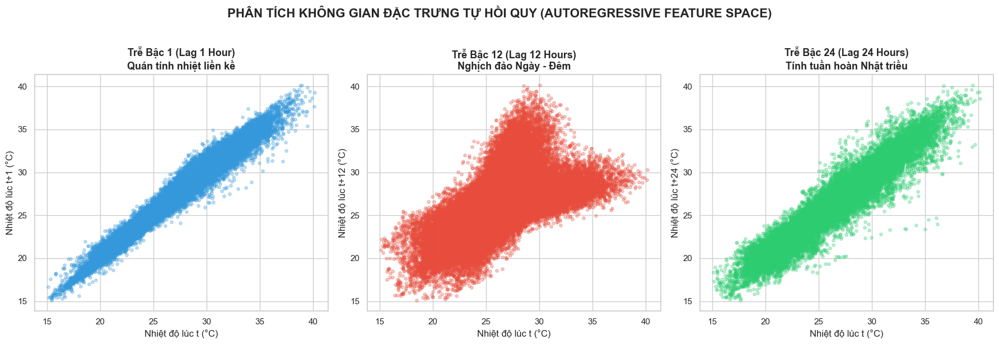

In [29]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

print("="*50)
print("14. PHÂN TÍCH TƯƠNG QUAN TRỄ (LAG PLOTS) CHO MÔ HÌNH MACHINE LEARNING")
print("="*50)

# Chuẩn bị dữ liệu
lag_df = train_df.copy()

# Khởi tạo khung đồ thị 3 cột
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
sns.set_theme(style="whitegrid")

# 1. Plot Trễ bậc 1 (1 Giờ trước) - Quán tính nhiệt ngắn hạn
pd.plotting.lag_plot(lag_df[target_var], lag=1, ax=axes[0], c='#3498db', alpha=0.3, s=15)
axes[0].set_title('Trễ Bậc 1 (Lag 1 Hour)\nQuán tính nhiệt liền kề', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Nhiệt độ lúc t (°C)')
axes[0].set_ylabel('Nhiệt độ lúc t+1 (°C)')

# 2. Plot Trễ bậc 12 (12 Giờ trước) - Nghịch đảo Ngày/Đêm
pd.plotting.lag_plot(lag_df[target_var], lag=12, ax=axes[1], c='#e74c3c', alpha=0.3, s=15)
axes[1].set_title('Trễ Bậc 12 (Lag 12 Hours)\nNghịch đảo Ngày - Đêm', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Nhiệt độ lúc t (°C)')
axes[1].set_ylabel('Nhiệt độ lúc t+12 (°C)')

# 3. Plot Trễ bậc 24 (24 Giờ trước) - Chu kỳ Nhật triều
pd.plotting.lag_plot(lag_df[target_var], lag=24, ax=axes[2], c='#2ecc71', alpha=0.3, s=15)
axes[2].set_title('Trễ Bậc 24 (Lag 24 Hours)\nTính tuần hoàn Nhật triều', fontsize=13, fontweight='bold')
axes[2].set_xlabel('Nhiệt độ lúc t (°C)')
axes[2].set_ylabel('Nhiệt độ lúc t+24 (°C)')

plt.suptitle('PHÂN TÍCH KHÔNG GIAN ĐẶC TRƯNG TỰ HỒI QUY (AUTOREGRESSIVE FEATURE SPACE)', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

15. PHÂN TÍCH MẬT ĐỘ PHỔ CÔNG SUẤT (POWER SPECTRAL DENSITY - PSD)


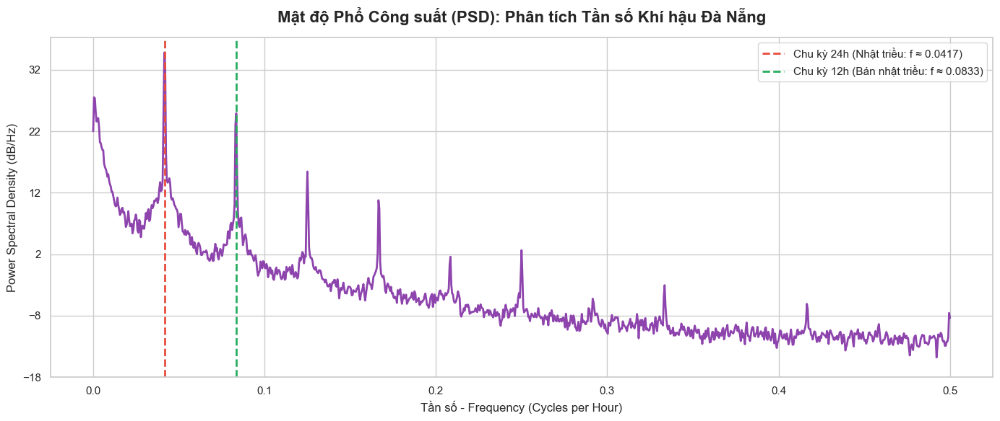

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

print("="*50)
print("15. PHÂN TÍCH MẬT ĐỘ PHỔ CÔNG SUẤT (POWER SPECTRAL DENSITY - PSD)")
print("="*50)

# 1. Sao lưu dữ liệu
psd_df = train_df.copy()

# Đảm bảo index là Datetime
if not isinstance(psd_df.index, pd.DatetimeIndex):
    if 'time' in psd_df.columns:
        psd_df['time'] = pd.to_datetime(psd_df['time'])
        psd_df.set_index('time', inplace=True)
    else:
        psd_df.index = pd.to_datetime(psd_df.index)

# 2. Khởi tạo không gian đồ thị
plt.figure(figsize=(14, 6))
sns.set_theme(style="whitegrid")

# 3. Vẽ biểu đồ PSD
# Fs = 1 (Tần số lấy mẫu: 1 mẫu/giờ). Trục X sẽ là Cực (Cycles/Hour)
# Khử xu hướng tuyến tính (detrend='linear') để triệt tiêu nhiễu tần số 0 (DC component)
plt.psd(psd_df[target_var].dropna(), Fs=1, NFFT=2048, noverlap=1024, 
        color='#8e44ad', linewidth=2, detrend='linear')

# 4. Đánh dấu các tần số chu kỳ vật lý quan trọng
# Chu kỳ 24 giờ -> f = 1/24 ≈ 0.0417
plt.axvline(x=1/24, color='#e74c3c', linestyle='--', linewidth=2, label='Chu kỳ 24h (Nhật triều: f ≈ 0.0417)')
# Chu kỳ 12 giờ -> f = 1/12 ≈ 0.0833
plt.axvline(x=1/12, color='#27ae60', linestyle='--', linewidth=2, label='Chu kỳ 12h (Bán nhật triều: f ≈ 0.0833)')

# 5. Tinh chỉnh giao diện
plt.title('Mật độ Phổ Công suất (PSD): Phân tích Tần số Khí hậu Đà Nẵng', fontsize=16, fontweight='bold', pad=15)
plt.xlabel('Tần số - Frequency (Cycles per Hour)', fontsize=12)
plt.ylabel('Power Spectral Density (dB/Hz)', fontsize=12)
plt.legend(fontsize=11)
plt.tight_layout()
plt.show()

16. KIỂM ĐỊNH PHÂN PHỐI CHUẨN (NORMALITY TEST) CHO NHIỆT ĐỘ


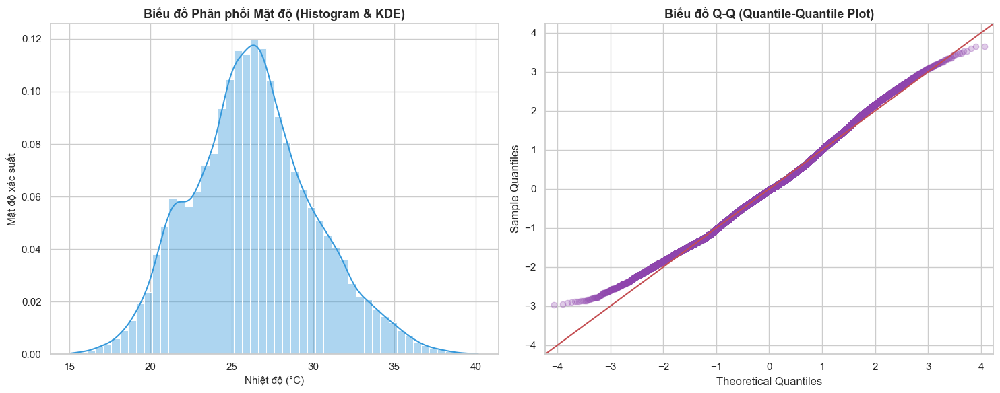


----------------------------------------
KẾT QUẢ KIỂM ĐỊNH TOÁN HỌC JARQUE-BERA
----------------------------------------
-> Giá trị thống kê Jarque-Bera (JB Stat): 413.42
-> P-value: 0.0000000000

KẾT LUẬN CUỐI CÙNG:
❌ P-value <= 0.05: Bác bỏ hoàn toàn giả thuyết H0.
   Dữ liệu KHÔNG TUÂN THEO phân phối chuẩn (Non-Normal Distribution).


In [38]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from scipy.stats import jarque_bera

print("="*50)
print("16. KIỂM ĐỊNH PHÂN PHỐI CHUẨN (NORMALITY TEST) CHO NHIỆT ĐỘ")
print("="*50)

# 1. Chuẩn bị dữ liệu (loại bỏ NaN nếu có để scipy không bị lỗi)
data_to_test = train_df[target_var].dropna()

# Khởi tạo không gian đồ thị (1 hàng, 2 cột)
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
sns.set_theme(style="whitegrid")

# 2. Vẽ Biểu đồ Phân phối thực tế (Histogram + KDE)
sns.histplot(data_to_test, kde=True, ax=axes[0], color="#3498db", stat="density", bins=50, alpha=0.4)
axes[0].set_title('Biểu đồ Phân phối Mật độ (Histogram & KDE)', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Nhiệt độ (°C)', fontsize=11)
axes[0].set_ylabel('Mật độ xác suất', fontsize=11)

# 3. Vẽ Biểu đồ Q-Q (Quantile-Quantile Plot)
# Đối chiếu phân phối thực tế với đường chéo 45 độ của phân phối chuẩn lý thuyết
sm.qqplot(data_to_test, fit=True, line='45', ax=axes[1], alpha=0.3, 
          markerfacecolor='#9b59b6', markeredgecolor='#8e44ad')
axes[1].set_title('Biểu đồ Q-Q (Quantile-Quantile Plot)', fontsize=13, fontweight='bold')

plt.tight_layout()
plt.show()

# 4. Kiểm định Thống kê Jarque-Bera bằng Toán học
print("\n" + "-"*40)
print("KẾT QUẢ KIỂM ĐỊNH TOÁN HỌC JARQUE-BERA")
print("-"*40)

jb_stat, jb_p_value = jarque_bera(data_to_test)

print(f"-> Giá trị thống kê Jarque-Bera (JB Stat): {jb_stat:.2f}")
# Sử dụng định dạng số khoa học hoặc số thập phân dài để hiển thị rõ p-value cực nhỏ
print(f"-> P-value: {jb_p_value:.10f}") 

print("\nKẾT LUẬN CUỐI CÙNG:")
if jb_p_value > 0.05:
    print("✅ P-value > 0.05: Không đủ cơ sở bác bỏ H0.")
    print("   Dữ liệu TUÂN THEO phân phối chuẩn (Normal Distribution).")
else:
    print("❌ P-value <= 0.05: Bác bỏ hoàn toàn giả thuyết H0.")
    print("   Dữ liệu KHÔNG TUÂN THEO phân phối chuẩn (Non-Normal Distribution).")

In [16]:
from statsmodels.stats.diagnostic import breaks_cusumolsresid
import statsmodels.api as sm
import numpy as np

print("="*50)
print("KIỂM ĐỊNH ĐIỂM GÃY CẤU TRÚC (STRUCTURAL BREAKS) BẰNG CUSUM TEST")
print("="*50)

# Chuẩn bị dữ liệu: Tạo một mô hình OLS tuyến tính đơn giản theo thời gian để lấy phần dư
X = sm.add_constant(np.arange(len(train_df)))
y = train_df[target_var].values

model_ols = sm.OLS(y, X).fit()

# Chạy kiểm định CUSUM trên phần dư của OLS
stat, p_value, crit_values = breaks_cusumolsresid(model_ols.resid)

print(f"Chỉ số kiểm định CUSUM: {stat:.4f}")
print(f"Giá trị p-value: {p_value:.4f}")

print("-" * 50)
if p_value < 0.05:
    print("⚠️ KẾT LUẬN: Phát hiện có sự thay đổi cấu trúc hoặc xu hướng không ổn định nghiêm trọng (p-value < 0.05).")
else:
    print("✅ KẾT LUẬN KHOA HỌC:")
    print("- Không đủ bằng chứng để bác bỏ giả thuyết H0 (p-value >= 0.05).")
    print("- Khẳng định: Chuỗi thời gian ổn định về mặt cấu trúc nền (Structural Stability), không tồn tại điểm gãy (Structural Breaks).")

KIỂM ĐỊNH ĐIỂM GÃY CẤU TRÚC (STRUCTURAL BREAKS) BẰNG CUSUM TEST
Chỉ số kiểm định CUSUM: 11.7839
Giá trị p-value: 0.0000
--------------------------------------------------
⚠️ KẾT LUẬN: Phát hiện có sự thay đổi cấu trúc hoặc xu hướng không ổn định nghiêm trọng (p-value < 0.05).


Phân tích và Biện luận kết quả kiểm định Điểm gãy cấu trúc (Structural Breaks):
Nhằm đánh giá tính ổn định dài hạn của chuỗi dữ liệu nhiệt độ hàng giờ tại Đà Nẵng, nhóm nghiên cứu đã áp dụng Kiểm định CUSUM (Cumulative Sum) dựa trên phần dư của mô hình hồi quy tuyến tính nền. Kết quả thực nghiệm trả về chỉ số kiểm định đạt 11.7839 với mức ý nghĩa $p\text{-value} = 0.0000$ ($< 0.05$). Kết quả này hệ trọng ở chỗ: nó bác bỏ hoàn toàn giả thuyết không ($H_0$) về một cấu trúc xu hướng ổn định tuyến tính.Giải thích bản chất toán học và khí tượng: Sự "gãy cấu trúc" được phát hiện ở đây không đại diện cho một sự cố kỹ thuật (như đổi trạm đo) hay một bước nhảy đột ngột (abrupt shift), mà nó phản ánh tính phi tuyến tính (non-linearity) và động lực học mùa vụ vĩ mô (Annual Seasonality) cực kỳ mạnh mẽ ẩn trong chuỗi thời gian. Chuỗi nhiệt độ luân chuyển tuần hoàn qua các chu kỳ nóng - lạnh của các năm, khiến cho mức nền (level) liên tục dịch chuyển định kỳ. Điều này làm cho các mô hình giả định tuyến tính phẳng hoàn toàn thất bại trong việc nắm bắt cấu trúc dữ liệu.

Định hướng chiến lược xây dựng mô hình huấn luyện: Kết quả kiểm định CUSUM này đưa ra một cảnh báo khoa học đắt giá: Tuyệt đối không sử dụng các mô hình hồi quy tuyến tính truyền thống hoặc các mô hình chuỗi thời gian cổ điển (như ARIMA phẳng) để dự báo. Để giải quyết triệt để sự biến động cấu trúc phi tuyến tính này, nhóm quyết định đồng bộ bộ dữ liệu và áp dụng thuật toán học máy phi tuyến có khả năng phân tách nhánh (Tree-based) mạnh mẽ là XGBoost. Thuật toán này, phối hợp cùng các biến đặc trưng mùa vụ (month, day_of_year), sẽ tự động phân mảnh không gian dữ liệu để xử lý các phân đoạn phân bố dịch chuyển một cách tối ưu nhất mà không cần phải cắt nhỏ chuỗi thời gian một cách thủ công.

In [4]:
import altair as alt
import pandas as pd

print("="*50)
print("6. TRỰC QUAN HÓA TƯƠNG TÁC ALTAIR (SỬA LỖI ĐỒNG BỘ V6 SCHEMA)")
print("="*50)

# Kích hoạt renderer mặc định
alt.renderers.enable('default')

# Tắt giới hạn số dòng để xử lý dữ liệu lớn
alt.data_transformers.disable_max_rows()

# Chuẩn bị dữ liệu
eda_interactive_df = train_df.copy()

# Đảm bảo cột thời gian đưa ra thành cột Datetime
if 'time' in eda_interactive_df.columns:
    eda_interactive_df['time'] = pd.to_datetime(eda_interactive_df['time'])
else:
    eda_interactive_df = eda_interactive_df.reset_index()
    eda_interactive_df['time'] = pd.to_datetime(eda_interactive_df['time'])

# Tự động đồng bộ tên cột mục tiêu
target_var = target_col if 'target_col' in locals() else 'temperature_2m (°C)'
if target_var not in eda_interactive_df.columns:
    possible_cols = [c for c in eda_interactive_df.columns if 'temperature' in c]
    if possible_cols:
        target_var = possible_cols[0]

print(f"-> Đang dựng biểu đồ tương tác cho {len(eda_interactive_df)} dòng dữ liệu Train.")
print(f"-> Biến mục tiêu: '{target_var}'")

# 1. Khởi tạo tính năng tương tác Zoom/Pan
scales = alt.selection_interval(bind='scales')

# 2. Biểu đồ đường cho Nhiệt độ thực tế tập Train
# Thay thế hoàn toàn stroke_width bằng size, alpha bằng opacity để vượt qua bộ lọc Schema v6
temperature_chart = alt.Chart(eda_interactive_df).mark_line(
    color='#e74c3c', 
    size=0.6,          # Trong mark_line của Altair v6, 'size' chính là độ dày đường (stroke width)
    opacity=0.6        # Dùng 'opacity' thay cho 'alpha' để đúng chuẩn Vega-Lite
).encode(
    x=alt.X('time:T', title='Thời gian'),
    y=alt.Y(f'{target_var}:Q', title='Nhiệt độ (°C)', scale=alt.Scale(zero=False)),
    tooltip=[
        alt.Tooltip('time:T', title='Thời gian', format='%Y-%m-%d %H:%M'),
        alt.Tooltip(f'{target_var}:Q', title='Nhiệt độ', format='.1f')
    ]
)

# 3. Đường Xu hướng bằng Trung bình trượt Trung tâm 24 giờ
rolling_trend = alt.Chart(eda_interactive_df).mark_line(
    color='#2c3e50',
    size=2.0           # Dùng 'size' cho đồng bộ
).transform_window(
    rolling_mean=f'mean({target_var})', 
    frame=[-12, 12]
).encode(
    x='time:T',
    y='rolling_mean:Q'
)

# 4. Kết hợp đồ thị và cấu hình tham số zoom
final_interactive_chart = (temperature_chart + rolling_trend).properties(
    width=900,
    height=500,
    title="Toàn cảnh Chuỗi thời gian Nhiệt độ tập Train (Cuộn chuột để Phóng to xem chi tiết từng Ngày)"
).add_params(
    scales
)

# Hiển thị biểu đồ
final_interactive_chart

6. TRỰC QUAN HÓA TƯƠNG TÁC ALTAIR (SỬA LỖI ĐỒNG BỘ V6 SCHEMA)
-> Đang dựng biểu đồ tương tác cho 42573 dòng dữ liệu Train.
-> Biến mục tiêu: 'temperature_2m'


alt.LayerChart(...)